<center><b>
    <font size="6" bold=True>Exploration and Classification of Card Simulation document</font></b></center>

# 1. Introduction

## The Business

Regulatory changes, digital transformation, and the arrival of new fin-tech players are the main drivers for the rapid evolution of financial services, and Thales DIS is a business that helps more than 3,000 financial institutions, retailers and other players meet this challenge, with multiple payment methods for both digital and physical transactions. Thales also provides a growing range of software and services for digital banking and payment services. This includes strong identity verification for enrolling new customers, payment data encryption, and multiple authentication schemes, including Biometrics, to access digital banking services.

Digital payment technology comes in many shapes with EMV* as the underlying technology. Thales DIS  supplies a complete range of form factors to accommodate specific constraints and business requirements, as an issuer of payment tools.

(see REF1 for more info about Thales DIS)

Payment cards are still the most commonly used form factor for financial transactions on Poit-of-Sales. Embarking state of the art authentication technology such as EMV compatible contactless chips, payment cards are also the strongest link between the financial institution, Thales customer, and the end user, the cardholder. For this reason, there is an understanding that payment cards are more than just a secured transaction enabler, but also represent a mean for communicating value and purpose to the end user. This understanding drives Thales offer of specially designed card bodies.

Combined with a wide offer of materials, ranging from biodegradable organic PLA to ocean reclaimed PET, from recycled PVC to fully metallic card bodies, the card body artwork is key for this non-tangible functionality of the payment card. But look and feel is not all that matters, regulatory rules and guidelines also dictates the dos and don’ts of a banking card designs, establishing branding standards (for VISA and MC, for example), compulsory use of secure elements, such as proprietary holograms and signature panels and traceability features, such as certified issuer identification and production batch numbers.

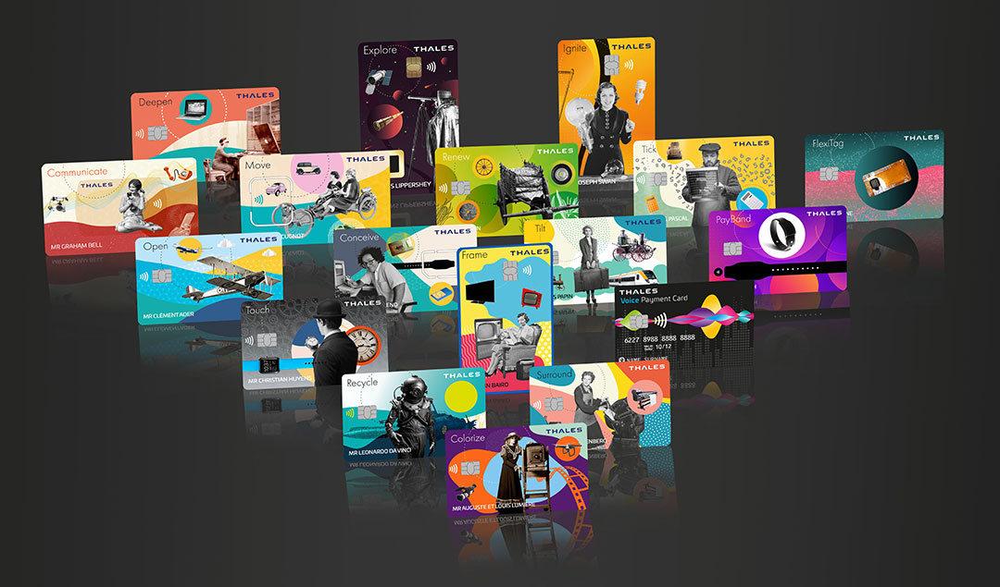

Ultimately, the banking card manufacturing business navigates in the intersection of several of many uncompromising requisites of cyber security (secured transaction on the digital cyber-space), physical security (secured card bodies), visual identity (from banks and regulatory bodies) and ESG (materials that transmit values and vision). For what we call a "card plant", a Thales DIS payment card manufacturing facility, the cyber-security aspect of the product is surprisingly the least pain for the local team. Standard EMV microchips, and highly standardized corporate-defined manufacturing processes, ensure a safe, highly efficient and robust environment for this core aspect of the product. On the day to day life, the devil lies on the details. While corporate processes takes care of the highly standardized logical aspect of the product (microchips, RF antenna, scripts, encription keys, ...), specific design requirements coming from the local customers (banks, fin-techs, retailers) have to be dealt by the local teams. Card materials may include metal core, PLA core, recycled PVC, colored core, transparent plastic, metallic foil, etc. Special artwork requirements may add to the overall complexity with special inks such as metallic, pearlescent, UV, tactile varnishes, and a variety of blocking foils and surface finishings. At Thales DIS the process responsible for gathering, organizing and validating customer requirements is called NPI, New Product Introduction.


## The Pain

The New Product Introduction process, or just NPI, starts with the consolidation of all customer requirements regarding the product in to a PDF formatted document called "Card Simulation" (in french "B.A.T de Simulation"). The "Card Simulation" is the document that brings structural information (high-level materials), artwork (image and specific color requirements) and finishing (surface aspect description and block foil effects) regarding the card-body. This same file is the one that is sent to the customer for final approval prior to any commitment of production and delivery when an order is takien.

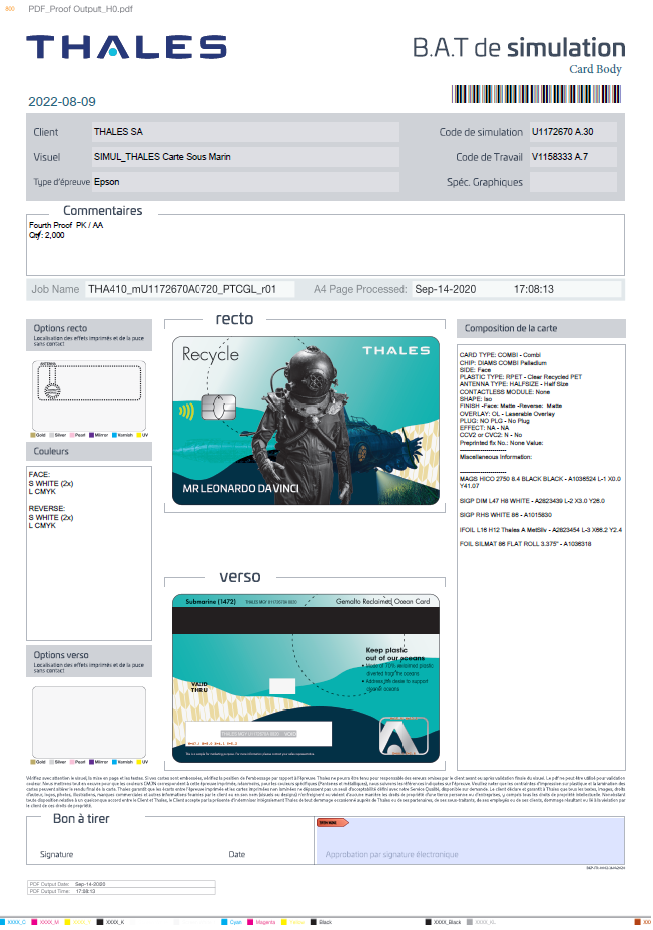

Once customer confirms their requirements are all well captured by the Card Simulation, the document is digitally signed and set as "released" in the "Product Data Management" tool, PDM. From now on, the so-called "U-Code" is release for production, and the Card Simulation will be the document to be referenced as "the customer requirement" for each order.

However, form "Card Simulation", where all requirements concerning the card-body are condensed and validated, to the release of the production order in the shop floor, a manual labor intense process of ERP configuration must take place, including the setup of the bill of materials (BOM) and the definition of the printing script (production route). The BOM consists in a hierarchical list of all materials (and fractions of materials) that will compose the final product (raw plastic, inks, magnetic stripe references, holograms, ...). Printing Script is the sequential list of printing operation that will be required to achieve final result (from a simple one shot of six-color offset front and reverse to a complex multi-layer of alternate silk-screen printing + multiple offset passes).

The correct definition of a printing script is a key step that determines the quality of the final product. One over-complex script will decrease productivity, increase production lead-time and increase the quantity of printing deffects. Over complex printing routes may also impact lamination quality (the quality of the adhesion between the diferent layers of plastics that compose the payment card) and the durability of the card in the field. In the other hand, an over-simplified script may not attend the visual aspect expected by the customer.

So there lies the pain…

The creation of the printing script based on the Card Simulation requires a lot of empirical experience and is subjected to mistakes and misinterpretation. Some complex artworks requires very complex scripts. Some may include only one operation some may need more than ten. Mistakes at this stage can cause a lot of rework and scrapped materials, not to mention delays in production schedule and customer dissatisfaction. The printing script alse defines the ammount of burden a card will require during the printing process. It is a valuable information for costing, as most importantly resource planning and scheduling.

The proposal here is to create a machine-learning model that can 'look' ate the card simulation and, as a minimum, aid the technical team on creating the appropriate printing script and BOM. The AI model can suggest scripts based on similarities (supervised learning) or simply create groups of artworks with similar characteristics that could aid an orient the team (unsupervised learning). Other possibilities could be providing a quick cost estimator for the card-body process, helping sales and bid teams to quickly respond to tenders and quotations. A Card Simulation pre-processing tool could also be useful to prevent errors when constructing the bill of materials (ie. why should we ask for a silver dove hologram if the simulation approves a golden one).

## Objectives

To develop a Machine Learnig model that can predict the printing process (script) for a given artwork. The prediction shall be done based only on information cumming from the PDF file representing the Card Simulation.

A 'printing process' is the sequence of printing operations that can be performed in any of the three types of printing equipment available in Thales DIS CWB plant:
- Heidelberg Speedmaster 6 color ofset Printer
- SAKURAI Silk Screen Printer

Exemples of printing scripts are:
- <10-H> - One single entry in the ofset machine
- <10-H,20-H,30-S> - Two entries in the ofset machine followed by one entry in the silkscreen machine
- <10-S,20-S,30-S,40-S,50-H,60-H,70-S> - Four entries in silkscreen, two entries in ofset, back to silkscreen for one more pass.

A diferent simplified notation of the script is such as 5S2H. It doesn't represent the sequence of operations but it does give us a pretty goo idea of the total resource required for the production, hence it is usefull for costing and high level planning.

## Project Breakdown

### Understanding the Business: Process Investigation

The process should be analysed in three parts: what happens before the simulation is build, what happens after the simulation is built and what are the needs and constrains of the printing process (end user).

#### Construction of Card Simulation

To identify the steps taken to create the Card Simulation document in order to understand how it is constructed. This step will ensure the project team has a verry good understanding of:
- Where each peace of information is comming from;
- How each product feature is represented in the file (text / pictogram /  imgae);
- How reliable each peace of information is;
- What is automatically generated in the file and what is dependent on human intervention (also reliability);
- Rules that are followed to create the document (standardization);
- How the image of the card is constructed.
- Where are the Card Simulation stored and how are they identified

#### Industrial configuration based on Card Simulation

To identify the steps taken once customer requirements are validate through the Card Simulation:
- How is the printing script defined;
- What is the relation between the image generated for the Card Simulation and the images generated for pre-press;
- How is the BOM constructed;
- What is the relation between the features described in the simulation and the parts listed in the BOM;
- How are the inks to be used defined/chosen;
- How is the data input process in the ERP;
- Where are ERP configuration stored and how they can be retreived;
- How should this data be linked with the Card Simulation?

#### Needs and Constrains of end user

Ultimately, the "end user" or "most interest part" of the decision to be taken by this solution is the card body printing area. The real end user is the designer responsible for the industrial configuration, but the area that will e most affected by this decision process is production. Understanding the needs and constrains of this area is key for the success of this endevour.
- How does the printing script affect the area?
- What are the printing equipment available?
- How are these equipment set-up?
- How does the pre-press operation planned and conducted?
- What are the effects of a bad Printing Script?

### Identification of Data Sources and Desired Outputs

The main focus of the project is choose the best printing script for an artwork by classifying the Card Simulation (U-Codes). As a secondary output, we may find that the feature engineering step can provide direct data for ERP configuration, saving time and/or providing means to avoid mistakes at this stage. In any case, precise definition of process inputs and outputs must be done:

Concerning Inputs:
- Where are all the data comming from?

The PDM tool is a flow and technical data management sytem that ensure Thales can deliver the correct and qualified technical solution to it's customer. It manages the flow for creating and validatin technical products, ensuring the configuration of each card is possible and correctly qulified. Technical items (chips, antenas, plastics, ...) and the validated combination of all the parts are constructed during the "marketing product" setup. Card arworks are designed by the design studio and laso uploaded and validated in the system. The software aspect is also managed there. When a card simulation is created, it makes sure the combination of technical product, artwork and software is feasible and validated by technical teams and the customer (through customer sarvice deparment). All card data in the Card Simulation are picked from a carefully maintained database of product configuration, with the exception of the "colors' field.

The color field is a free text field used by the designer or the artwork to inform about specific color requirements from the customer. Although many 'color systems' exist and are available (most comonly used is the Pantone Color System) sometimes uncommon color referecens are used for creation, most commonly, samples. So sometimes, Pantone references are refered to in the "colors" field, sometimes just color names and references to samples sent (mostly cards from other manufacturers or older production runs). Sometimes, the color info provided will oly make reference to a CMYK process or digital files. For this reason, the use of the image also provided in the card simulation may be key.

- What is the quality of the data? (completion, integrity, consistency, reliability)

All technical data is reliable and repetitive. Color data is erratic and in form of free text (non structured data)

- What are the security and ethical constrains to be taken into consideration while handling the data?

The card simulation is highly confidential as they bring detalied information of Thales card structure and design. It also contains images that are considered customer property.

- What is the diference between historical data (tobe used in the modeling and validation steps) and Actual data?

Industry need to adapt and evolvo according to the market. Cards production are no exception. Historical data will always have a temporal variable related to the evolution of the printing procecss. In the past two years, there were relevant equipment, process and product evolutions that will have an impact on the quality and reliability of the data availabe. This must be taken into consideration when preparing and cleanning the data (remove obsolete processas as well as mistakes) and prepare the model for future evolutions. The conceptual odeling of this solution has started in H2-2022, so script data and Card Simulations used will not reflect happening after this time.

**Note 01**: During 2021, with the rapid ramp up of dual interface cards, many scripts have evolved from single core (front and reverse of the artwors are printed on same sheet of plastic, meaning we need one set of operation for the front side printing and one set for the back side printing) to split core (face and reverse are printed on separate sheets that are later laminated together). This change has enabled us to print front and reverse on same sheet that is later on cut in two for being colated together. This has simplified the printing process for many cards, but it also mean we may find the same artwor with very diferent scripts on istorical data.

**Note 02**: With the microprocessor crisis initited by the COVID19 pandemy, Thales had the need to develope multiple microconductor suppliers. If one technical part of the card changes in PDM (ie a new Infineon chip introduced ro replace or complement older Samsung chip, we will have same artwork with diferent card simulations or ucode reference)

**Note 03**: Other key material suppliers had to be developed after the shortage crisis in 2020 and 2021 (following still in 2022), such as PVC, this causes instability in the process. Historical data will include fluctuations in scripts related to quality issues of plastic material that require extra silk-screen operations for the application of exceptional lamination varnishes. This will also add ramdom variation in the script defined.


### Collecting and Preparing the Data

This step may become a project on it's own as one of the identified challenges of this project concerns the extracion of features from card simulation document. The task is to download thousands of PDF documents and extract from each one of them relevant information for the decision making and organise them in a dataset. Extracting the desired features for the PDF file may require some NLP skills, image classification skills, character recognition skills and a good share of digital image processing. In any case, the first challenge will be to clearly define what the features are and how to identifythem in the document. 

#### Feature Engineering

As the Card Simulation is in fact a PDF file with text description and several images, includding the visual representation of the printed card body. One of the key stpes in data preparation is reading the PDF files and breaking it appart in text blocks and images.

PDF can be opened and 'broken appart' using specific libraries for block text extration and image clipping. Non-structured text and categorical lables and be encoded using tokenization and atributes can be taken from the images using some other readily vailable networks (see reference). 

#### Data cleanning and Selection

Once all PDFs are preprocessed, the project team must ensure there is suficient data of all possible variation to compose a clean, complete and balanced data-set, that will be devided in training, test and validation data.

### Modeling and Model Evaluation

As important as the modeling itself is choosing the right classification model for the task. To begin with, we must make sure we can answer the following questions:
- How much data is there and is it continuous?
- What type of data is it?
- What are we trying to accomplish? (Performance, training time, cost, Inference time)
- How important is it to visualize the process? (Explainability)
- How much detail do we need? (Complexity, dimensionality)
- Is storage a limiting factor? (Data size)

Once some of these questions are answered, a decision map may be used for that (see references).

The approach to be used will be START SIPLES / ANNALYSE / ADD REFINEMENS.

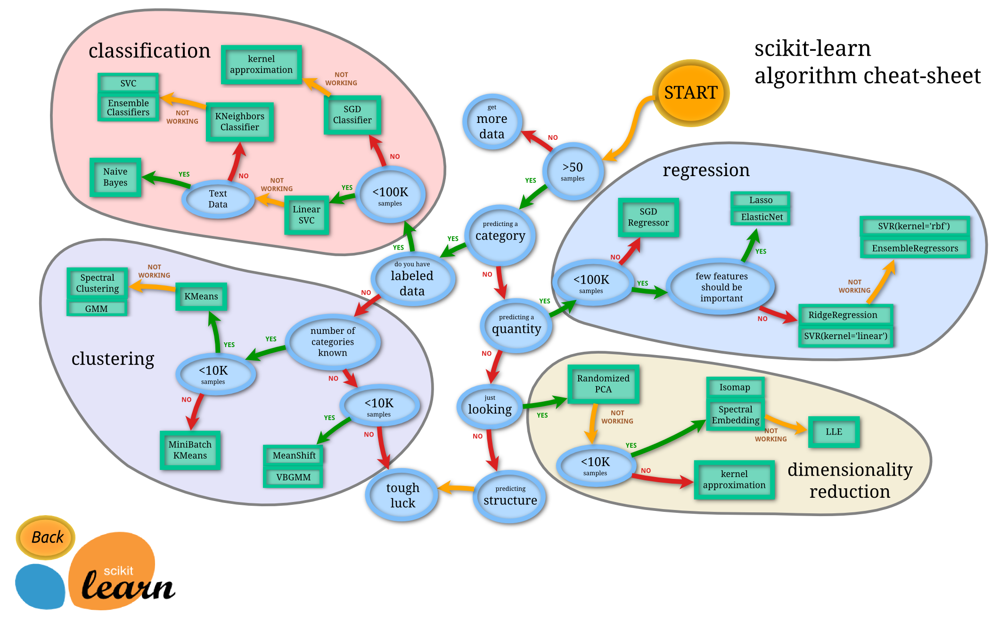

Some tipe of cross-validation may also be used at this stage for selectiong the best option. Cross-validation is a model assessment technique used to evaluate a machine learning algorithm's performance when making predictions on new datasets it has not been trained on. This is done by partitioning a dataset and using a subset to train the algorithm and the remaining data for testing.

### Live Operation and Iterations

Once the desired result is achieved with a valdated and reliable model, the solution can be implemented in the live studio. A low risk approach can be taken here as empirical heuristc method will still be available to challenge the machine learning approach. Remember that the objective here is not necessarly to do better that the heuristic approach but to support the decision making process with alternatives, and reduce the risk of productivity loss due to bad decision in the pre-press stage. The organisation may also take good advantages of the tools an investigation that will take place during the development of the project and a lot of effort will be applied on understanding the complex universe of the visual arts. Some other advantage that can be taken from an ML solution as such is the possinility of batch processing u-codes on globl planning tools, supporting card-plant loading decision making and costing.

As the Card Simulation is the best representation of customer expectations regarding the physical aspect of the product (complementary to the logical functionality) the objective is to extract as much data from this document to ensure that industrial configuration matches customer requirement without mistakes. We can antecipate the main challenges as follows:
- Data gathering and preparation: Quality data is key for any machine learning project, and finding consistent, coplete and correct historical information in any manufacturing facility is always a challenge, specially when there is no good "data-culture". Process and system evolution and non-corrected human errors are to be found everywhere.
- Feature engineering: Although most information about the final product will be decribed in the Card Simulation, the interpretation of this information when contructing the production routes or scripts have always relied on the knowledge and experience of printing technicians. The exploration of all this "hidden features" from a PDF file can be very challenging.
- Modeling for script definition: the model to be used may need to deal with several types of inputs, as categorical info, continual numerical info, color names, images, etc.

As a typical data science project, this projects will be devided in 7 macro steps (*see REF2 + specieal needs refinement*):

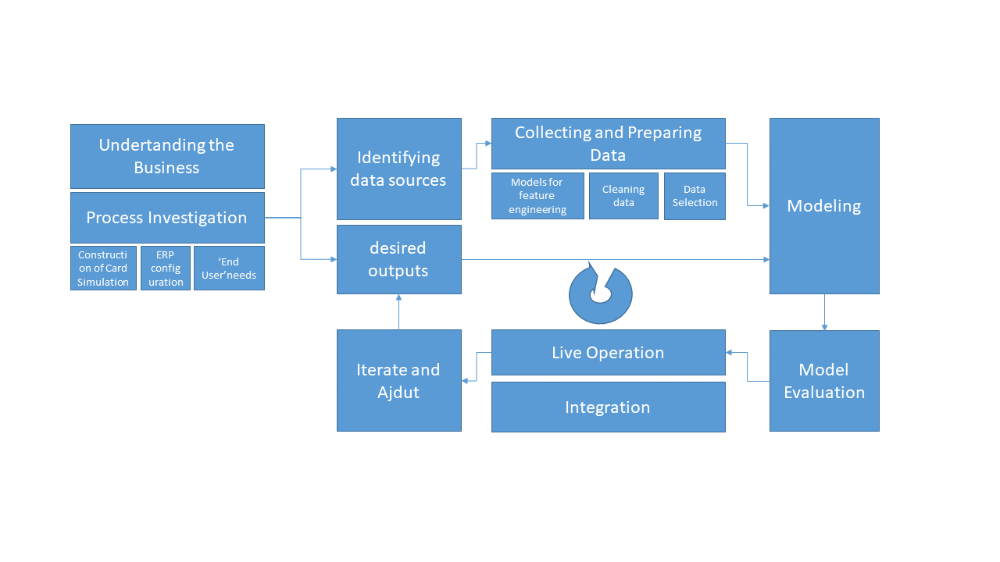

Detailed description of each step is provided hereafter.

## Security and Confidentiality Considerations

Card Simulations and BOM are internal Thales DIS documents classified as THALES GROUP LIMITED DISTRIBUTION. They contain:
- Customer owned artwork (some of them may be still secret);
- Customer requirements for payment card technology;
- Proprietary images belonguing to payment processing institutions such as VISA, Master Card, ELO, etc.;
- Technical ditails of THALIS DIS operations.

According to Thales Group Data Protection standards, a document classified as C2 - THALES GROUP LIMITED DISTRIBUTION is a non-public information having a low level of sensitivity and that can be disclosed to:
- any Thales employee, unless this mark is suffixed with a more restricted audience,
- and partners/contractors who have the need to know.

While “need to know” remains a key security principle, this data can typically be distributed without significant harm outside of the intended “need to know circle” within Thales. Exchanges with external parties should be protected by some form of commitment to respect the need to know (e.g. contract, Non Disclosure Agreement, Terms of Service and similar) for the Thales data.


# Project Development

## Libraries and Constants used 

Concentrating all libraries here to make sure all code can be ran at any time (not always from begunning)

In [1]:
###############################################################################################################
#                                           KEY CELL                                                          # 
###############################################################################################################

# GENERAL LIBS

# Sub folder containing raw input data
DATA_FOLDER = "DATA/"

import re #Regular Expression (for text preprocessing)
#import IPython
#import fitz
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import time
#import pyperclip
import datetime
import pickle
import os
from datetime import datetime
from PIL import Image
from tqdm.notebook import tqdm
import seaborn as sns

from sklearn.model_selection import train_test_split
#from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import pairwise_distances
from sklearn.cluster import DBSCAN

In [2]:
# SPECIFIC FOR PDF DOWNLOADS FROM PDM

#Web Scraper for downloading PDM data
import pyautogui
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.common.keys import Keys 
from webdriver_manager.chrome import ChromeDriverManager

ModuleNotFoundError: ignored

In [3]:
# MODELS

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.cluster import DBSCAN
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, add
from tensorflow.keras.utils import to_categorical

from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [4]:
#KERAS LSTM Models

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, add
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.sequence import pad_sequences

## Functions

In [5]:
###############################################################################################################
#                                           KEY CELL                                                          # 
###############################################################################################################


def A_err(actual, predicted):
    """
    A_err omputes the diference between two scripts by measuring the differente between the Union and Intersection of its projected areas on each axl
    See "Error Measuring"
    """
    rot_error = 0
    rot_error = rot_error + len(Union(rot_area(actual)[0], rot_area(predicted)[0]))-len(
        intersection(rot_area(actual)[0], rot_area(predicted)[0]))
    rot_error = rot_error + len(Union(rot_area(actual)[1], rot_area(predicted)[1]))-len(
        intersection(rot_area(actual)[1], rot_area(predicted)[1]))
    return rot_error/2


def rot_area(rot):
    sH, sS = 0, 0
    AH, AS = [], []
    if rot == '<>':
        return AH, AS
    else:
        rot = rot.replace('<', '')
        rot = rot.replace('>', '')
        for op in rot.split(','):
            if op.split('-')[1] == 'H':
                sH = sH+1
                i = 0
                while i <= sS:
                    AH.append((10*sH)+i)
                    i = i+1
            else:
                sS = sS+1
                i = 0
                while i <= sH:
                    AS.append((10*i)+sS)
                    i = i+1
        return AH, AS


def Union(lst1, lst2):
    final_list = list(set(lst1) | set(lst2))
    return final_list


def intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3

def plot_error_pareto(plt_data):
    # define aesthetics for plot
    color1 = 'steelblue'
    color2 = 'red'
    line_size = 4

    # create basic bar plot
    fig, ax = plt.subplots()
    ax.bar(plt_data.index, plt_data['count'], color=color1)

    # add cumulative percentage line to plot
    ax2 = ax.twinx()
    ax2.plot(plt_data.index, plt_data['cumperc'],
             color=color2, marker="D", ms=line_size, )
    ax2.yaxis.set_major_formatter(PercentFormatter())
    ax2.set_ylim([0, 1])

    # specify axis colors
    ax.tick_params(axis='y', colors=color1)
    ax2.tick_params(axis='y', colors=color2)

    # display Pareto chart
    plt.show()

    print('Accuracy 0:', plt_data['cumperc'][0])
    print('Accuracy 1:', plt_data['cumperc'][2])

def TransformRot(rot):
    """ 
    Here we need to preprocess the output as it will become a stream of tokens
    transform "newROT" in a tokenizable text with spaces in place of commas
    """
    to_return = "<"
    for r in rot[1:-1].split(','):
        to_return = to_return + " " + r
    to_return = to_return + " >"
    return to_return

def data_generator(data_keys, mapping, features, tokenizer, max_length, vocab_size, batch_size):
    """
    create data generator to get data in batch (avoids session crash)
    """
    # loop over UCODES
    X1, X2, y = list(), list(), list()
    n = 0
    while 1:
        for key in data_keys:
            n += 1
            roteiros = mapping[key]
            # process each caption
            for roteiro in roteiros:
                # encode the sequence
                seq = tokenizer.texts_to_sequences([roteiro])[0]
                # split the sequence into X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pairs
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical(
                        [out_seq], num_classes=vocab_size)[0]
                    # store the sequences
                    X1.append(features[key])
                    X2.append(in_seq)
                    y.append(out_seq)
            if n == batch_size:
                X1, X2, y = np.array(X1), np.array(X2), np.array(y)
                yield [X1, X2], y
                X1, X2, y = list(), list(), list()
                n = 0

def idx_to_op(integer, tokenizer):
    """
    In order to evaluate the model we need some scripts to convert the array resut back to operations
    """
    for operacao, index in tokenizer.word_index.items():
        if index == integer:
            return operacao
    return None


def predict_script(model, ufeatures, tokenizer, max_length):
    """
    Re-genera script for UCODE
    """
    # add start tag for generation process
    in_text = '<'
    # iterate over the max length of sequence
    for i in range(max_length):
        # encode input sequence
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        # pad the sequence
        sequence = pad_sequences([sequence], max_length)
        # predict next word
        yhat = model.predict([ufeatures, sequence], verbose=0)
        # get index with high probability
        yhat = np.argmax(yhat)
        # convert index to word
        operation = idx_to_op(yhat, tokenizer)
        # stop if word not found
        if operation is None:
            break
        # append word as input for generating next word
        in_text += " " + operation
        # stop if we reach end tag
        if operation == '>':
            break
    return in_text


def evaluatemodel(model, features, tokenizer, max_lengh, test, rot_map, Results):

    newROT = []
    predROT = []

    for key in tqdm(test):
        # get actual caption
        operations = rot_map[key]
        operation = rot_map[key][0]
        newROT.append("<" + operation[2:-2].replace(" ", ",") + ">")
        # predict the operation for Ucode
        y_pred = predict_script(model, np.array(
            [features[key]]), tokenizer, max_lengh)
        if y_pred[-1]=='>':
            predROT.append("<" + y_pred[2:-2].replace(" ", ",") + ">")
        else:
            predROT.append("<" + y_pred[2:].replace(" ", ",") + ">")
        # split into ops
        actual_ops = [operation.split() for operation in operations]
        y_pred = y_pred.split()
        # append to the list

    diference = []
    Aerr = []
    for r1, r2 in zip(newROT, predROT):
        diference.append(str(abs(r1.count('S')-r2.count('S'))) +
                         'S' + str(abs(r1.count('H')-r2.count('H'))) + 'H')
        Aerr.append(A_err(r1, r2))
    Results[model.name + '_prev'] = predROT
    Results[model.name + '_dif'] = diference
    Results[model.name + '_Aerr'] = Aerr

    return Results

def print_code_details(key,Results, text_data):
    display(Results[Results.index == key])
    print(key, text_data[key])
    img = [0, 0, 0, 0]
    img[0] = Image.open('PDF_IMAGE_CLIPS/' + key + '_FACE.png').convert('RGB')
    img[1] = Image.open('PDF_IMAGE_CLIPS/' + key +
                        '_Front_Effects.png').convert('RGB')
    img[2] = Image.open('PDF_IMAGE_CLIPS/' + key + '_BACK.png').convert('RGB')
    img[3] = Image.open('PDF_IMAGE_CLIPS/' + key +
                        '_Back_Effects.png').convert('RGB')
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(25, 5))
    for i in range(len(img)):
        axes[i].imshow(img[i])
    plt.show()


def predict_script_single(key, model, tokenizer, features_img, max_length=17, in_text='<'):
    """
    # Adpting the previously used function to predict for one case only in such a way it also returns the certinty of the prediction:
    # USE SPACES TO SEPARATE OPERATIONS instead of ','
    # Second ataptation is the possibility of passing starting text as parameters.
    """
    # add start tag for generation process
    cert_arry = []
    # iterate over the max length of sequence
    for i in range(max_length):
        # encode input sequence
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        # pad the sequence
        sequence = pad_sequences([sequence], 17)
        # predict next word
        ufeatures = np.array([features_img[key]])
        yhat = model.predict([ufeatures, sequence], verbose=0)
        # get highest certainty
        cert_arry.append(np.amax(yhat))
        # get index with high probability
        yhat = np.argmax(yhat)
        # convert index to word
        operation = idx_to_op(yhat, tokenizer)
        # stop if word not found
        if operation is None:
            break
        # append word as input for generating next word
        in_text += " " + operation
        # stop if we reach end tag
        if operation == '>':            
            break
    return in_text, cert_arry

def print_faces(keys, test):
    rows = ((len(keys)+3)//4)
    lcol = ((len(keys)-1) % 4+1)
    row = 0
    col = 0

    if rows > 1:
        fig, axes = plt.subplots(nrows=rows, ncols=4, figsize=(4*15, rows*10))
    else:
        fig, axes = plt.subplots(nrows=rows, ncols=4, figsize=(4*15, 10))
    for key in keys:
        #print(row, col)
        def tt(): return " in test" if key in test else " in train"
        # Check if ucode is on tran or test (to add this info to name)
        if rows > 1:
            axes[row, col].imshow(Image.open(
                'PDF_IMAGE_CLIPS/' + str(key) + '_FACE.png').convert('RGB'))
            axes[row, col].set_title(key + tt(), fontdict={'fontsize': 24})
        else:
            axes[col].imshow(Image.open('PDF_IMAGE_CLIPS/' +
                             str(key) + '_FACE.png').convert('RGB'))
            axes[col].set_title(key + tt(), fontdict={'fontsize': 24})
        if row < (rows-1):
            if col < 3:
                col = col+1
            else:
                col = 0
                row = row+1
        else:
            if col < lcol-1:
                col = col+1
            else:
                break
    plt.show()

def print_ucode_cluster(ucode, features_img, labels, distances, y, test):
    """
    # In order to help with the analysis this function will either print the artworks that belong to same cluster or, it it is an outlier, print the three most similar
    # arworks vound on the database based on the euclidean distan 'distances'
    """
    ucodes = np.array(list(features_img.keys()))
    l_index = np.where(ucodes == ucode)[0][0]
    label = labels[l_index]
    if label >= 0:
        # Print ucodes from same cluster
        indexes = np.where(labels == label)
        ucodes = []
        for i in indexes[0]:
            ucodes.append(list(features_img.keys())[i])
        print('CLUSTER LABEL:', label)
        actuals = []
        for code in ucodes:
            actuals.append(y[y.index == code].newROT.values[0])
        print_faces_with_script(ucodes, actuals, test)

    else:
        # print ucode and 3 closest cards
        ucodes = [ucode]
        u_dist = []
        sorted_indices = np.argsort(distances[l_index])
        for i in range(3):
            i_smallest_index = sorted_indices[i+1]
            u_dist.append(distances[l_index][i_smallest_index])
            ucodes.append(list(features_img.keys())[i_smallest_index])
        print(ucodes[0], 'is an outlier. Closer ucodes distance:', u_dist)
        actuals = []
        for code in ucodes:
            actuals.append(y[y.index == code].newROT.values[0])
        print_faces_with_script(ucodes, actuals, test)


def print_faces_with_script(keys, scripts, test):
    rows = ((len(keys)+3)//4)
    lcol = ((len(keys)-1) % 4+1)
    row = 0
    col = 0

    if rows > 1:
        fig, axes = plt.subplots(nrows=rows, ncols=4, figsize=(4*15, rows*10))
    else:
        fig, axes = plt.subplots(nrows=rows, ncols=4, figsize=(4*15, 10))
    for key, script in zip(keys, scripts):
        #print(row, col)
        def tt(): return " in test" if key in test else " in train"
        # Check if ucode is on tran or test (to add this info to name)
        if rows > 1:
            axes[row, col].imshow(Image.open(
                'PDF_IMAGE_CLIPS/' + str(key) + '_FACE.png').convert('RGB'))
            axes[row, col].set_title(key + tt(), fontdict={'fontsize': 36})
            axes[row, col].set_xlabel(script, fontdict={'fontsize': 36})
        else:
            axes[col].imshow(Image.open('PDF_IMAGE_CLIPS/' +
                             str(key) + '_FACE.png').convert('RGB'))
            axes[col].set_title(key + tt(), fontdict={'fontsize': 36})
            axes[col].set_xlabel(script, fontdict={'fontsize': 36})
        if row < (rows-1):
            if col < 3:
                col = col+1
            else:
                col = 0
                row = row+1
        else:
            if col < lcol-1:
                col = col+1
            else:
                break
    plt.show()

## Data Collection and Prepration

### Historic production data containing the U-Codes, the script used and Work-Order information

The starting point of the work is finding historical data containing the items produced, it's respective Card Simulation and the script used for card-body production. This data is available in the platform used for work order sequencing in the printing shop-floor called "SmartPlaces".

Bellow the exploration a treatment of the csv file extracted from Smartplaces in Aug/22, containing production history since the implementation of Smartplaces:

In [ ]:
# Open dataset parsing dates for columns "DATA_INICIO" and "DATA_FIM"
df = pd.read_csv(DATA_FOLDER + "Historico_Ordens_Smartplaces.csv",
                 parse_dates=['DATA_INICIO', 'DATA_FIM'])
df[3000:3005]


,SO,DESCRICAO,ROTEIRO,SIMULATION,ARTWORK,DATA_INICIO,DATA_FIM,TIPO,QUANTIDADE
3000,SO84511.002,CARD_VISA CLASSIC BCI CLESS,"<10-S,20-H,30-S>",U1163948B,V1150594B,2021-04-20 05:24:55,2021-04-27 10:13:58,Normal,5500
3001,SO84699.012,SIMUL SANTANDER AADVANTAGE PLATINUM MC .,"<10-S,20-D>",U1167619B,V1153977B,2021-04-28 23:05:00,2021-05-04 21:42:43,Normal,3000
3002,SO84699.001,SIMUL SANTANDER PREMIUMINTERNACIONAL MC,"<10-S,20-D>",U1101400L,V1090926J,2021-05-04 15:46:46,2021-05-05 08:11:46,Normal,5000
3003,SO84476.001,VISA DEBITO CASH AZUL CTLSS,<10-H>,U1125870G,V1112996E,2021-04-17 20:30:00,2021-04-17 22:26:00,Normal,10000
3004,SO84745.003,SIMUL BRADESCO EXCLUSIVE MAIS INTER ELO,"<10-S,20-H,30-S>",U1133235E,V1120123E,2021-04-26 08:15:25,2021-04-26 09:57:05,Normal,10000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7230 entries, 0 to 7229
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   SO           7230 non-null   object        
 1   DESCRICAO    7230 non-null   object        
 2   ROTEIRO      7230 non-null   object        
 3   SIMULATION   7183 non-null   object        
 4   ARTWORK      7183 non-null   object        
 5   DATA_INICIO  7230 non-null   datetime64[ns]
 6   DATA_FIM     7230 non-null   datetime64[ns]
 7   TIPO         7230 non-null   object        
 8   QUANTIDADE   7230 non-null   int64         
dtypes: datetime64[ns](2), int64(1), object(6)
memory usage: 508.5+ KB


As source of training data, the information needed is a list of SIMULATION (also known as u-code, or card simulation id) and ROTEIRO (production script). QUANTIDADE (quantity) DATA_INICIO (start date) could also be useful and will be kept. As for valid data we can see there are null data in SIMULATION and ARTWORK. Those will be dropped.

In [ ]:
df.drop(['DESCRICAO', 'ARTWORK', 'SO', 'DATA_FIM'],
        axis=1, inplace=True)  # droping useless data
df[["ROTEIRO", "SIMULATION"]] = df[["ROTEIRO", "SIMULATION"]].astype(
    str)  # transforming data type from object to string
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7230 entries, 0 to 7229
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   ROTEIRO      7230 non-null   object        
 1   SIMULATION   7230 non-null   object        
 2   DATA_INICIO  7230 non-null   datetime64[ns]
 3   TIPO         7230 non-null   object        
 4   QUANTIDADE   7230 non-null   int64         
dtypes: datetime64[ns](1), int64(1), object(3)
memory usage: 282.5+ KB


The field "TIPO" gives us they type of order. Not all types of orders will be of our interest:

In [ ]:
df.TIPO.value_counts()

Normal          4441
Prioridade      1830
Prova            677
Fast Track       222
Limpeza           31
Teste             28
Adiantamento       1
Name: TIPO, dtype: int64

- Normal = *Normal* work order - TO BE CONSIDERED
- Prioridade = Work orders set as high *priority* - TO BE CONSIDERED
- Prova = Work order for manufacturing a *proof*, those don't always follow the final production script as at this stage an artwork may be under development - NOT TO CONSIDER
- Fast Track = Urgent work order with highr priority as the PRIORIDADE - TO BE CONSIDERED
- Limpeza/Teste/Adiandamento = Test orders - NOT TO BE CONSIDERED

Once clean, the field "TIPO" cal also be discarded.

In [ ]:
df.drop(df.loc[df['TIPO'] == 'Prova'].index, inplace=True)
df.drop(df.loc[df['TIPO'] == 'Limpeza'].index, inplace=True)
df.drop(df.loc[df['TIPO'] == 'Teste'].index, inplace=True)
df.drop(df.loc[df['TIPO'] == 'Adiantamento'].index, inplace=True)
df.drop(['TIPO'], axis=1, inplace=True)

We can also see that there are musltiples entries for some of the U-Codes, those are reinciding orders. We'll keeping only one entry for each U-Code, keeping the most recent one considering the DATA_INICIO (start date):

In [ ]:
df.sort_values('DATA_INICIO', ascending=True, inplace=True)
# dropping multiple instances
df.drop_duplicates('SIMULATION', keep='last', inplace=True)
df.drop(df.loc[df['SIMULATION'] == 'N/D'].index, inplace=True)  # droppind NDs
df.drop(df.loc[df['SIMULATION'] == 'U'].index, inplace=True)
df.dropna(axis=0)
df = df.reset_index()
df.drop(['index'], axis=1, inplace=True)
df.head()

,ROTEIRO,SIMULATION,DATA_INICIO,QUANTIDADE
0,<10-D->,U1165650B,2019-11-07,2050
1,"<10-S,20-S,30-S,40-S,50-D,60-D,70-M>",U1150769B,2019-11-11,2000
2,<10-H-*>,U1116813F,2019-11-19,15000
3,<10-X>,U1163104A,2019-11-19,10000
4,<10-H>,U1165066A,2019-11-19,3000


Now let's examine the script entries (ROTEIRO). From the first 5 entires we van see that some cleanning must be done. We are currently intereste only in the operations for the Offset printing (notation H or X) and silkscreen (notation S). Everything else is *garbage* and must be cleaned out.

The correct notation we want to keep is writte as:

<10-A,20-A,30-A,...> where 10, 20, 30, ... are the squential operation and A is the process to be used, being H for offset and S for silkscreen.

Lets, separate all notations used and deal with them case y case:

In [ ]:
list_of_ops = []  # initialize list of operations
for r in df.ROTEIRO:  # looping through all scripts in the df
    # cleaning start and stop tags
    a = r.replace("<", "")
    b = a.replace(">", "")
    # spliting commas
    r_list = re.split(r',', b)
    # for each operation, remove sequence number
    for r in r_list:
        rl = r[r.find("-")+1:]
        if rl not in list_of_ops:
            list_of_ops.append(rl)

# print(list_of_ops)
charcount = [0]*len(list_of_ops)
for char, i in zip(list_of_ops, range(len(list_of_ops))):
    for r in df.ROTEIRO:
        if char in r:
            charcount[i] = charcount[i]+1
# print(charcount)
for char, i in zip(list_of_ops, range(len(list_of_ops))):
    print(char, ": ", charcount[i])

D- :  7
S :  1110
D :  459
M :  35
H-* :  5
X :  318
H :  788
X- :  24
S- :  27
S-* :  11
X-* :  7
D-* :  4
M-* :  5
B-* :  1
H- :  16
B :  26
x- :  8
s- :  7
SEIS CORES :  1
I :  2
 :  1553
s-  :  0
Ss- :  1


The convertion to be used is described on the sets.

In [ ]:
# Equivalence lists:
S = ('S', 'Ss-', 'S-*', 's-', 'S-')  # All possible notations for S
# D is the old digital printer already phased out (scripts not to be considered)
D = ('D', 'D-*', 'D-', 'd-')
# M is the mono color equipment already phased out (scripts not to be considered)
M = ('M', 'M-*')
X = ('X', 'X-*', 'X-', 'x-')  # All possible notations for offste equipment
B = ('B', 'B-*')  # Offset 2 colors already discontinued.
H = ('H', 'H-*', 'H-', 'X')  # Old way of explessing X
DROP = ('V-*', 'I', 'B', 'M', 'SEIS CORES', 'D')  # Certainly typos
cleanup = (X, S, D, M, H, B)

# Replace chars in equivalence list
cleanROT = df.ROTEIRO.copy()
for char in cleanup:
    new = char[0]
    i = 1
    while i < len(char):
        for j in range(len(cleanROT)):
            cleanROT[j] = cleanROT[j].replace(" ", "")
            if char[i] in cleanROT[j]:
                cleanROT[j] = cleanROT[j].replace(char[i], new)
        i = i+1
df['newROT'] = cleanROT

# Eliminate 'DROP' list
for r in df.newROT:
    for ban in DROP:
        if ban in r:
            d_index = df.newROT[df.newROT == r].index
            df.drop(d_index, inplace=True)
            df.reset_index(drop=True)

list_of_ops = []
for r in df.newROT:
    a = r.replace("<", "")
    b = a.replace(">", "")
    r_list = re.split(r',', b)
    for r in r_list:
        rl = r[r.find("-")+1:]
        if rl not in list_of_ops:
            list_of_ops.append(rl)

# print(list_of_ops)

charcount = [0]*len(list_of_ops)

for char, i in zip(list_of_ops, range(len(list_of_ops))):
    for r in df.newROT:
        if char in r:
            charcount[i] = charcount[i]+1
# print(charcount)
for char, i in zip(list_of_ops, range(len(list_of_ops))):
    print(char, ": ", charcount[i])

H :  1047
S :  829


In [ ]:
print('So, after cleaning up all typos and obsolete routings, we have kept a list of',
      len(df), 'unique UCodes with its respective scripts')
print('Oldest recor:', df.DATA_INICIO.min())
print('Most recent record:', df.DATA_INICIO.max())
print('Unique U-Codes:', len(df.SIMULATION))

So, after cleaning up all typos and obsolete routings, we have kept a list of 1047 unique UCodes with its respective scripts
Oldest recor: 2019-11-19 00:00:00
Most recent record: 2022-09-15 19:52:45
Unique U-Codes: 1047


In [ ]:
# Save Cleaned up file
df.to_csv(DATA_FOLDER + "UCode_and_Scripts.csv")

### Card Simulation

As descibd before, cards simulation represents the ultimate confirmation of customer requirements in terms of products, it is a document controled by a flow applpication called PDM (Product Data Management). PDM controls the creation of all technical product documentation and it's approval a nd validation flows. As in the section above we have retrieve a list of UCodes (Card Simulation codes) with it's respective printing scripts, now we need to go to PDM and download each Cards Simulation contained in the list.

#### Downloading Card Simulation from PDM

In [ ]:
# Need special firwall permit to initially download driver
options = Options()
options.add_argument("start-maximized")
driver = webdriver.Chrome(service=Service(
    ChromeDriverManager().install()), options=options)

[WDM] - Downloading: 100%|██████████| 6.58M/6.58M [00:03<00:00, 1.93MB/s]


In [ ]:
# Note: downloading PDFs may take time, about 20s per PDF
# PDFs will be downloaded into the Download folder of the PC
# Mannualy mode PDFs to PDF folder

# Open Chrome instance for scraping
options = Options()
options.add_argument("start-maximized")
driver = webdriver.Chrome(service=Service(
    ChromeDriverManager().install()), options=options)

# Log in to PDM using operatos common password (read only)
driver.get('https://www2.pdm.gemalto.com/Windchill/app/')  # ABrir PDM
time.sleep(2)
pyautogui.write("optgsmcuritiba")  # Login
time.sleep(2)
pyautogui.press("tab")
time.sleep(2)
pyautogui.write("optgsmcuritiba")  # Senha
time.sleep(2)
pyautogui.press("enter")
time.sleep(10)

# get List of Ucodes from df

# Get list of UCODES to download
list_Ucodes = df.SIMULATION.map(lambda x: x[0:9]).tolist()

# get list of PDFs previously downloaded

PDF_FILES = "PDFs"
filenames = next(os.walk(PDF_FILES), (None, None, []))[2]  # [] if no file
print(len(filenames), 'files already downloaded.')

# clean list to download
eliminate = []
for code in list_Ucodes:
    if any(code[0:8] + '_Rev' + code[8:9] in file for file in filenames):
        eliminate.append(code)
for code in eliminate:
    list_Ucodes.remove(code)
print(len(list_Ucodes), 'files to download.')

downloaded = []
excessoes = []
for Ucode in tqdm(list_Ucodes):
    try:
        botao_search = driver.find_element(
            By.XPATH, "//*[@id='gloabalSearchField']")  # Encontra campo search
        botao_search.send_keys(Ucode[0:8], Keys.ENTER)  # Busca por Codigo U
        time.sleep(7)
        botao_search = driver.find_element(
            By.XPATH, "//*[@id='wt.fc.Persistable.defaultSearchView.searchInListTextBox']")  # Encontra campo de filtro
        # Filtra por Rev + "."
        botao_search.send_keys(Ucode[8:9] + '.', Keys.ENTER)
        time.sleep(1)
        # Encontra link para pagina do codigo U
        codigo_u = driver.find_element(By.LINK_TEXT, Ucode[0:8])
        codigo_u.click()
        time.sleep(7)
        action_but = driver.find_element(
            By.XPATH, "//*[@id='infoPagedetailsPageActionsMenu']")  # Encontra Action Button
        action_but.click()
        time.sleep(1)
        publish_but = driver.find_element(
            By.XPATH, "//*[@id='object_publishSubMenu_infoPagedetailsPageActionsMenu_menu']")  # Encontra Publish button
        publish_but.click()
        time.sleep(1)
        publish_final_btn = driver.find_element(
            By.XPATH, '//*[text()="Publish Simulation"]')
        publish_final_btn.click()
        downloaded.append(Ucode)
        pickle.dump(downloaded, open(
            DATA_FOLDER + "/Downloaded_list.pkl", "wb"))
    except:
        print('UCode in exception:', Ucode)
        excessoes.append(Ucode)
        pickle.dump(downloaded, open(
            DATA_FOLDER + "/Exceptions_list.pkl", "wb"))
driver.close()

1543 files already downloaded.
24 files to download.


  0%|          | 0/24 [00:00<?, ?it/s]

UCode in exception: U123456
UCode in exception: U1234567A
UCode in exception: U0000000


In [ ]:
# The two exceptions in the donload attempt are clearly dummy data. Better to eliminate thoes records from df

df.drop([df[df['SIMULATION'] == 'U123456'].index[0],
        df[df['SIMULATION'] == 'U1234567A'].index[0]], inplace=True)
df.to_csv(DATA_FOLDER + "UCode_and_Scripts.csv")

#### Identifying and Isolating Atributes in PDF Card Simulation

When analysing the contents of a Card Simulation document, we can devide it in several sections:

![card-simulation-data.png](attachment:card-simulation-data.png)

01 - Heading: Administrative data concerning the product, the customer and the job to be done. This data is not usefyll for defining printing process.

02 - Visual representation of finishing options to be contained in the front of the card. Here we may find important info concerning special finishing details that may not be clearly defined in the text or in the main image.

03 - Textual description of colors, inks and effects to be used in the artwork. Very important data concerning inks and colors to be used. Inks are normally refered to by it's commun name (white, black, silver, ...) or pantone color (234C).

04 - Visual representation of finishing options to be contained in the back of the card.

05 - Image of the front of the card

06 - Image of the back of the card

07 - Technical composition of the card.Here we will find two very important information that affect the printing process. The type of plastic to be used ('PLASTIC TYPE:') and if the card will have any kind of surface effect ('EFFECT:').

On the text data there are few information that can be identified as useful or critical features of each artwork, those are:
- Plastic Type - plastic type (transparent, metalic foil, recycled) is key for defining the printing process. While plain white PVC is straigh forward to print, color PVC or PVC covered with metalic foils may need extra passes of white silk-screen to cover the base color before printing.
- Effects: Some visual effects such as 3D varnish or tactile varnishe may not be visible in the artwork image. Those cases should be described under the "EFFECT: tag in the text data and/or be represented in the effects images.
- Colors: Althoug the image of the card should describe the colors in terms of visual, the custorme mat specify specific color requiments in the "Color" section of the PDF text data.

Note that most of the technical card-body data in the PDF is not relevant for the definition of the printing process.

Less obvious information such as the arrangement of colors, color trapping and so on may only be available by analysing the image of the card. At this point we are considering retrieving the image of the card and the image of the effects (Options) as there mey be relevant features to be extracted from these images.

So next step is to retrieve the .txt information from the PDF files and obtain clipppings of the relevant images, saving those files using the UCode and Revision of the PDF:

In [ ]:
PDF_FILES = "PDFs"

# Get list of files in PDFs file
filenames = next(os.walk(PDF_FILES), (None, None, []))[2]  # [] if no file

# Clip all files
# naming each cliped image file
clip_name = ('FACE', 'BACK', 'Front_Effects', 'Back_Effects')
matriz = (2, 2, 2, 2)  # matix of dimentions (zooming) TO EXTRACT CLIPPING
# Position of start and end points of clips
RI = ((159, 306), (159, 540), (27, 320), (27, 616))
RF = ((401, 459), (401, 693), (140, 400), (140, 696))
text_data = {}

for file in tqdm(filenames):  # loop through files in directory mypath
    if file[-3:] == "pdf":  # checks if is PDF
        pdf_file = fitz.open("PDFs/" + file)  # open the file
        # get Ucode from PDF file name
        UCode = file[file.find("_U")+1:file.find("_U")+9]
        Revision = file[file.find("_Rev")+4:file.find("_Rev")+5]

        # Now starts going through PDF file
        page = pdf_file[0]
        for n, m, ri, rf in zip(clip_name, matriz, RI, RF):
            pix = page.get_pixmap(matrix=fitz.Matrix(
                m, m), clip=fitz.Rect(ri, rf))
            pix.save("PDF_IMAGE_CLIPS/" + UCode + Revision + "_" + n + ".png")

        # get plain text (is in UTF-8)
        text = page.get_text(option='blocks')
        text_full = page.get_text()
        plastic_type = text_full[text_full.find("PLASTIC TYPE:")+len(
            "PLASTIC TYPE:")+1:text_full.find("\n", text_full.find("PLASTIC TYPE:")+1)]
        effect = text_full[text_full.find(
            "EFFECT:")+len("EFFECT:")+1:text_full.find("\n", text_full.find("EFFECT:")+1)]
        if UCode + Revision not in text_data:
            text_data[UCode+Revision] = []
        # find color block
        ii = -5
        for i in [1, 2, 3, 4, 5]:
            if (25 < text[-i][0] < 34) and (423 < text[-i][1] < 434):
                ii = -i
        text_data[UCode+Revision] = [text[ii][4], plastic_type,
                                     effect]  # colors text block, plastic type, effect


pickle.dump(text_data, open(DATA_FOLDER +
            "/text_features' + datetime.now().strftime('%y%m%d%H%M%S') + '.pkl", "wb"))

  0%|          | 0/1543 [00:00<?, ?it/s]

Now, for any U-Code we have a clean Script (target data), 4 images and the text data: color fields, plastic type and effect extracted from the PDFs.
i.e:

U-Code: U1118968D
Printing Script <10-S,20-H,30-S>
Plastic Type: PVC - Black PVC
Effects: NA - NA
Colors: FACE:
S GLITTER SILVER S4170
S SCREEN WHITE
L CMYK
L BLUE 280
L YELLOW 108
L SPOT BLACK
 
REVERSE:
S GLITTER SILVER S4170
L CMYK
L SPOT BLACK
S SCREEN WHITE 1



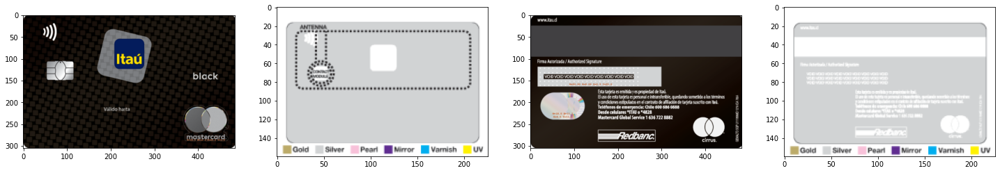

In [ ]:
# for any U code in df:
ucode = 'U1118968D'
print('U-Code:', ucode)
print('Printing Script', df.newROT[10])
print('Plastic Type:', text_data[ucode][1])
print('Effects:', text_data[ucode][2])
print('Colors:', text_data[ucode][0])
img = [0, 0, 0, 0]
img[0] = Image.open('PDF_IMAGE_CLIPS/' + ucode + '_FACE.png').convert('RGB')
img[1] = Image.open('PDF_IMAGE_CLIPS/' + ucode +
                    '_Front_Effects.png').convert('RGB')
img[2] = Image.open('PDF_IMAGE_CLIPS/' + ucode + '_BACK.png').convert('RGB')
img[3] = Image.open('PDF_IMAGE_CLIPS/' + ucode +
                    '_Back_Effects.png').convert('RGB')
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(25, 5))
for i in range(len(img)):
    axes[i].imshow(img[i])
plt.show()

## Test and Train Data Split

In the previous topics we have gathered data of about 1.4k diferent and unique cards. We have a mixture of categorical data, natural language and images. The unique reference for all this information is the U-Code followed by it's revision letter (ie U1234567A). The first step for modeling is consider preprocessing categorical and text data and separating the list of U-Codes for consistent training and testing  of difent models (ensure diferent models can be trained and tested with the same random selection of artworks)

Here we concentrate the split of data and the preparating of specific data files to be used in the models to be developed. Test and train data are stored either as pickles or csvs to ensure consistancy and repetibility for model comparation and evaluation.

In [ ]:
# Open DF with UCode and Script data
df = pd.read_csv(DATA_FOLDER + "UCode_and_Scripts.csv")
ucodes = df.SIMULATION.values

# Load pickle with text data
file = open(DATA_FOLDER + 'text_features.pkl', 'rb')
text_data = pickle.load(file)

In [ ]:
# text data preprocessor - clean text
for key, features in text_data.items():
    for i in range(len(features)):
        # take one feature at a time
        feature = features[i]
        # preprocessing steps
        # convert to lowercase
        feature = feature.lower()
        # delete special chars, etc.,
        feature = feature.replace('[^A-Za-z0-9]', '')
        # delete additional spaces
        feature = feature.replace('\s+', ' ')
        # delete line-bresks
        feature = feature.replace('\n', ' ')
        # delete single leter stuff
        nosingles = ''
        for token in feature.split():
            if len(token) > 1:
                nosingles = nosingles + " " + token
        feature = nosingles
        # Join "PLASTIC TYPE" and "EFFECT" for better one-hot
        if i > 0:
            feature = feature.replace(' ', '')
        # add start and end tags to the caption
        features[i] = feature

# Encode Features
# create vocabulary
vocab = []
for key in text_data:
    for feature in text_data[key]:
        vocab.append(feature)

tokenizer = Tokenizer()
tokenizer.fit_on_texts(vocab)
vocab_size = len(tokenizer.word_index) + 1

# Save Tokenizer for later use (implementation)
with open(DATA_FOLDER + 'tokenizer.pickle', 'wb') as handle:
    pickle.dump(tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)

# create list of features array
flist = []
for key, features in text_data.items():
    flist.append(features[0] + " " + features[1] + " " + features[2])

# Create list for columns names
cols = [0]
i = 0
while i < vocab_size:
    if i > 0:
        cols.append(tokenizer.index_word[i])
    i = i+1

# create X df
X = pd.DataFrame(tokenizer.texts_to_matrix(flist),
                 columns=cols, index=text_data.keys())
X.drop(X.columns[0], axis=1, inplace=True)

# create y df
y = pd.DataFrame(df.newROT).set_index(df.SIMULATION)

# Make sure X and Y conicides
newindex = X.index.intersection(y.index)
X = X[X.index.isin(newindex)].sort_index()
y = y[y.index.isin(newindex)].sort_index()

# Now separating X and y train and text data and saving them for consistent use

# Split data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1)

# Save indexes in lists (for dictionary handling)
train = X_train.index.values.tolist()
test = X_test.index.values.tolist()


In [ ]:
X

,nana,face,reverse,cmyk,pvcwhitepvc,white,black,2035,165,1375,...,metalico,349,555,impreso,reverser,568,qr,guias,absreverse,0458
U1001634K,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
U1001634L,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
U1002573F,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
U1002573G,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
U1020561M,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U1192410A,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
U1192413A,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
U1192877A,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
U1193239A,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


X is a features dataframe with one hot encoding of selected features and color text data

y is a scrips data frame containing clear routes on the shape '<10-X,20-S,...>

X_train, X_test, y_train, y_test are the arrays containing a random split of 90/10 data

train and test are list of Ucodes on train and test data

In [ ]:
# Salvar dados de treino e teste para posterior reprodução
TestnTrain = [X_train, X_test, y_train, y_test, X, y]
pickle.dump(TestnTrain, open(os.path.join(DATA_FOLDER + 'testntrain' +
            datetime.now().strftime('%y%m%d%H%M%S') + '.pkl'), 'wb'))

## Modeling

### Retrieving Test and Train data

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
###############################################################################################################
#                                           KEY CELL                                                          # 
###############################################################################################################

# Run this code to retrieve previously saved data on test and train split to ensure repeatibility on evaluations
DATA_FOLDER = '/content/drive/MyDrive/i2a2/Gutenberg/DATA/'
file = open(DATA_FOLDER + 'testntrain.pkl', 'rb')
TestnTrain = pickle.load(file)
X_train, X_test, y_train, y_test, X, y = TestnTrain[0], TestnTrain[
    1], TestnTrain[2], TestnTrain[3], TestnTrain[4], TestnTrain[5]

# Save indexes in lists (for dictionary handling)
train = X_train.index.values.tolist()
test = X_test.index.values.tolist()

# Load pickle with text data
file = open(DATA_FOLDER + 'text_features.pkl', 'rb')
text_data = pickle.load(file)

# Create Reuslts df for compairing results af all created models
Results = pd.DataFrame(data=y_test.values, columns=['Actual']).set_index(X_test.index)

### Model Selection

As our objetive is to predict one of many possibilities of printing processes from a complex but fixed set of features (text data and images extracted from the Card Simulation), we have to look into models that can deal with either multiclass classification (more than two classes) or with a sort of recurent "one-to-many-model", that can produce a script on an operation by operation prediction.

Let's start by following the decision process suggested by the Scikit Learn Useg Guide:

<img src="Documentation Images/Scikit Learn Choosing Estimator.png" alt="Choosing Estimator Model" />

Following the decision process suggested by the cheat-sheet, we can clearly fall into the range starting by KNeighbors, Support Vectors or Ensemble Classifiers.

### K-Neighbours Classifier

The principle behind nearest neighbor methods is to find a predefined number of training samples closest in distance to the new point, and predict the label from these. The number of samples can be a user-defined constant (k-nearest neighbor learning), or vary based on the local density of points (radius-based neighbor learning). The distance can, in general, be any metric measure: standard Euclidean distance is the most common choice.

As we know how many groups to expect (number of unique scripts in the test data) we have a 'k' to start with.

In [ ]:
k = len(y.newROT.value_counts())  # Total number of scrips in y
KN = KNeighborsClassifier(n_neighbors=k)
KN.fit(X_train, y_train.newROT)
y_pred_KN = KN.predict(X_test)

# Load accuracy scorer
print("Acuracia para classificador Ramdom Forest",
      accuracy_score(y_pred_KN, y_test.newROT))

Acuracia para classificador Ramdom Forest 0.24509803921568626


Not to bad for a first attempt, and vey quick!
Let's take a look at the confusion matrix...

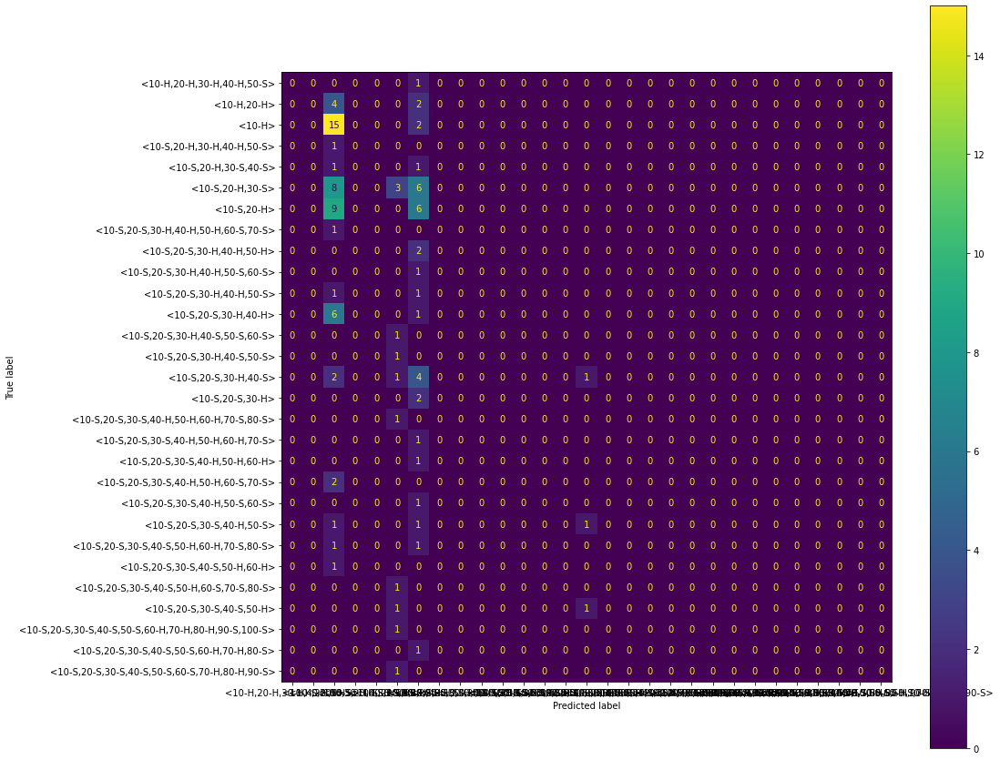

Acuracia para classificador KNeighbours 0.24509803921568626


In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
plot_confusion_matrix(KN, X_test, y_test.newROT, ax=ax)
plt.show()

y_pred_RF = KN.predict(X_test)
print("Acuracia para classificador KNeighbours",
      accuracy_score(y_pred_KN, y_test.newROT))

Intereting to see that most of the predictions is falling within a small groups of scripts, ignoring all possible variations. For better understandin os the predition results, let's criate a "Results" dataframe to store actual values and predictions.

In [ ]:
# See predicted values:
Results['KN_pred'] = y_pred_KN
display(Results.KN_pred.value_counts(normalize=True))
print('Actual scripts in test:', len(Results.Actual.value_counts()))

<10-H>                   0.519608
<10-S,20-H>              0.343137
<10-S,20-H,30-S>         0.107843
<10-S,20-S,30-H,40-S>    0.029412
Name: KN_pred, dtype: float64

Actual scripts in test: 29


Out of 29 possible scripts, KNeighbours have grouped everypredition in only 4 groups, and got only 24% of the scripts right. But how wrong has it got the ones that were not right?

#### Error Measuring

We need to stablish a way of compairing two scripts and calculating how close they are to each other. We know that if A is '<10-S,20-H>' and P is '<10-S,20-H>' the error is 0, but what if P is <10-S,20-S>? and what ir it is <10-S,20-H,30-H>?

One possible way of calcuating the "distance" between two scripts is to consider each type of operation (S and H) a cartesian dimention and 'walk' along the plane (SxH) to see where the final point stand. If we do it like that, the distance between two scripts could be the eucliedean distance of the final point of each script after walking along plane SxH. With such method, the scripr <10-S,20-H> would be represented as a cartesian point (1,1) and the script <10-S,20-H,30-H> would be (1,2), and the distance between them would be sqrt(1^2+2^2).

(ilustration)

The problem with this method is that it ignores the fact that two scripts can have the same number of each operation but having them in diferent sequence. For example <10-S,20-S,30-H> is very diferent from <10-S,20-H,30-S>, and they are both represented by the same (2,1) point. So a better way to describe the diference between two scripts is to measure the area between them:

(ilustration)

For practica definition, we will be considering the diference between two scripts the diference betweem the union nd the intersection of the defined by the projection of each script on each axel of operation. As described by the following ilustration and calculated by the function A_err (Area error)

(Ilustration)


Function 'A_err' decfined in '### Fuctions' returns the Area error (rotational error) between two scripts

NOTE: A_err is built for a script containiing 2 equipments. If more complex scripts are used, a new method will need to be built.

In [ ]:
# We are also showing the difference between the two scripts in terms of number of oerations...
diference = []
Aerr = []
for r1, r2 in zip(y_test.newROT, y_pred_KN):
    diference.append(str(abs(r1.count('S')-r2.count('S'))) +
                     'S' + str(abs(r1.count('H')-r2.count('H'))) + 'H')
    Aerr.append(A_err(r1, r2))
Results['KN_dif'] = diference
Results['KN_Aerr'] = Aerr

Results.KN_Aerr.value_counts(normalize=True).sort_index()

0.0     0.245098
0.5     0.039216
1.0     0.186275
1.5     0.019608
2.0     0.156863
2.5     0.009804
3.0     0.058824
3.5     0.058824
4.0     0.068627
5.0     0.019608
5.5     0.009804
6.0     0.019608
6.5     0.009804
8.0     0.029412
8.5     0.019608
9.0     0.009804
9.5     0.009804
10.0    0.019608
14.0    0.009804
Name: KN_Aerr, dtype: float64

For better visualization and comparation we can also print the pareto of the errors:

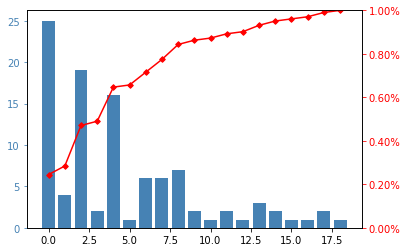

Accuracy 0: 0.24509803921568626
Accuracy 1: 0.47058823529411764


In [ ]:
KN_plt_data = pd.DataFrame(
    {'count': Results.KN_Aerr.value_counts().sort_index().values})
KN_plt_data['cumperc'] = Results.KN_Aerr.value_counts(
    normalize=True).sort_index().values.cumsum()

plot_error_pareto(KN_plt_data)

### Random Forest Classifier

Following the cheat-sheet, we can see that if K-Neighbors are not working, we could try more comples ensembe methods. The goal of ensemble methods is to combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator. One of such methos is Random Forest Classifier.

In random forests each tree in the ensemble is built from a sample drawn with replacement (i.e., a bootstrap sample) from the training set.

Furthermore, when splitting each node during the construction of a tree, the best split is found either from all input features or a random subset of size max_features. 

The purpose of these two sources of randomness is to decrease the variance of the forest estimator. Indeed, individual decision trees typically exhibit high variance and tend to overfit. The injected randomness in forests yield decision trees with somewhat decoupled prediction errors. By taking an average of those predictions, some errors can cancel out. Random forests achieve a reduced variance by combining diverse trees, sometimes at the cost of a slight increase in bias. In practice the variance reduction is often significant hence yielding an overall better model.

In [7]:
RF = RandomForestClassifier(random_state=1, bootstrap=True, max_samples=None)
RF.fit(X_train, y_train.newROT)
y_pred_RF = RF.predict(X_test)

print("Acuracia para classificador Ramdom Forest",
      accuracy_score(y_pred_RF, y_test.newROT))

Acuracia para classificador Ramdom Forest 0.5882352941176471


Lets play with the parameter max_samples to see if accuracy can be improved.

In [8]:
max_samples = [5, 10, 50, 250, 500, len(X_train)]

for ms in max_samples:
    RF = RandomForestClassifier(bootstrap=True, max_samples=ms)
    RF.fit(X_train, y_train.newROT)
    y_pred_RF = RF.predict(X_test)

    print("Acuracia para RFC com Max Samples =", ms,
          ":", accuracy_score(y_pred_RF, y_test.newROT))

Acuracia para RFC com Max Samples = 5 : 0.14705882352941177
Acuracia para RFC com Max Samples = 10 : 0.23529411764705882
Acuracia para RFC com Max Samples = 50 : 0.4019607843137255
Acuracia para RFC com Max Samples = 250 : 0.5196078431372549
Acuracia para RFC com Max Samples = 500 : 0.5588235294117647
Acuracia para RFC com Max Samples = 914 : 0.5392156862745098


Same with the number of trees in the forest:

In [9]:
n_estimators = [50, 100, 200, 500]

for n in n_estimators:
    RF = RandomForestClassifier(
        bootstrap=True, max_samples=len(X_train), n_estimators=n)
    RF.fit(X_train, y_train.newROT)
    y_pred_RF = RF.predict(X_test)

    print("Acuracia para RFC com Max Samples =", n,
          ":", accuracy_score(y_pred_RF, y_test.newROT))

Acuracia para RFC com Max Samples = 50 : 0.5588235294117647
Acuracia para RFC com Max Samples = 100 : 0.5588235294117647
Acuracia para RFC com Max Samples = 200 : 0.5588235294117647
Acuracia para RFC com Max Samples = 500 : 0.5784313725490197


It doesn't get much better than that:

In [14]:
RF = RandomForestClassifier(bootstrap=True, max_samples =len(X_train) , n_estimators=500)
RF.fit(X_train, y_train.newROT)
y_pred_RF = RF.predict(X_test)

print("Acuracia para RFC com Max Samples = len(x_train) e n_estimators = 500:", accuracy_score(y_pred_RF, y_test.newROT))

Acuracia para RFC com Max Samples = 500 e n_estimators = 500: 0.5784313725490197


NameError: ignored

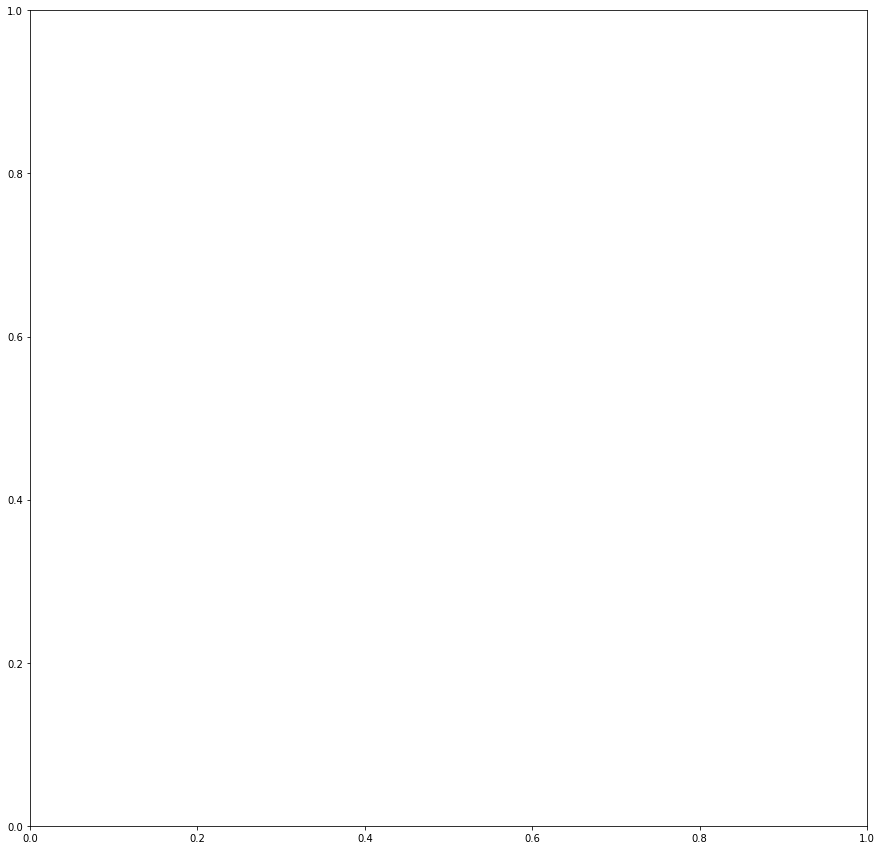

In [15]:
# Matriz de confusão sobre MLP em newROT
fig, ax = plt.subplots(figsize=(15, 15))
plot_confusion_matrix(RF, X_test, y_test.newROT, ax=ax)
plt.show()

y_pred_RF = RF.predict(X_test)
print("Acuracia para classificador MLPC",
      accuracy_score(y_pred_RF, y_test.newROT))

With a 59% accuracy, we can also see that, comparing with the K-Neighbours model, the Random forrest can predict a much wider gange of scripts.

Lets recodr the error in the Results df and plot the pareto for later comparation.

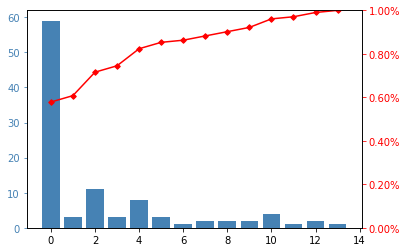

Accuracy 0: 0.5784313725490197
Accuracy 1: 0.715686274509804


In [16]:
# update Result DF for results comparation

diference = []
Aerr = []
for r1, r2 in zip(y_test.newROT, y_pred_RF):
    diference.append(str(abs(r1.count('S')-r2.count('S'))) +
                     'S' + str(abs(r1.count('H')-r2.count('H'))) + 'H')
    Aerr.append(A_err(r1, r2))
Results['RF_pred'] = y_pred_RF
Results['RF_dif'] = diference
Results['RF_Aerr'] = Aerr

# Display error paretho

RF_plt_data = pd.DataFrame(
    {'count': Results.RF_Aerr.value_counts().sort_index().values})
RF_plt_data['cumperc'] = Results.RF_Aerr.value_counts(
    normalize=True).sort_index().values.cumsum()
plot_error_pareto(RF_plt_data)

 ### Multi-Layer Perceptron Classifier (MLPC)

Multi-layer Perceptron (MLP) is a supervised learning algorithm that learns a function by training on a dataset. Given a set of features and a targets, it can learn a non-linear function approximator for either classification or regression. It is different from logistic regression, in that between the input and the output layer, there can be one or more non-linear layers, called hidden layers.

In [ ]:
# Modelo MLPClassifier (simple scikit lear neural network classifier)
MLPC = MLPClassifier()
MLPC.fit(X_train, y_train.newROT)
y_pred_MLPC = MLPC.predict(X_test)
print("Acuracia para classificador MLP no newROT: ",
      accuracy_score(y_pred_MLPC, y_test.newROT))

Acuracia para classificador MLP no newROT:  0.5392156862745098


c:\Users\narand\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Let's increase the number of iteractions (default=200) to achieve convergence as a minimum.

In [ ]:
# Increasin number if iteractions to try on converging
MLPC = MLPClassifier(max_iter=1000)
MLPC.fit(X_train, y_train.newROT)
y_pred_MLPC = MLPC.predict(X_test)
print("Acuracia para classificador MLPC no newROT: ",
      accuracy_score(y_pred_MLPC, y_test))

Acuracia para classificador MLPC no newROT:  0.5588235294117647


What if we increase the number of hidden layers (default=100)

In [ ]:
hidden_layer_sizes = [100, 150, 200, 300]
for hls in hidden_layer_sizes:
    MLPC = MLPClassifier(max_iter=1000, hidden_layer_sizes=hls)
    MLPC.fit(X_train, y_train.newROT)
    y_pred_MLPC = MLPC.predict(X_test)
    print("Acuracia para classificador MLPC hls =", hls, ":",
          accuracy_score(y_pred_MLPC, y_test))

Acuracia para classificador MLPC hls = 100 : 0.5686274509803921
Acuracia para classificador MLPC hls = 150 : 0.5392156862745098
Acuracia para classificador MLPC hls = 200 : 0.5686274509803921
Acuracia para classificador MLPC hls = 300 : 0.5784313725490197


It doesn't seem to affect the result but it does affect solving time.

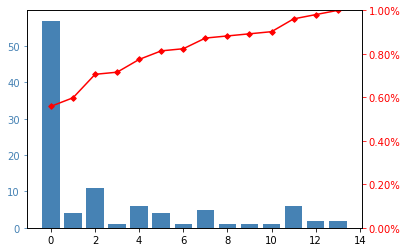

Accuracy 0: 0.5588235294117647
Accuracy 1: 0.7058823529411764


In [ ]:
# Add results do DF results
diference = []
Aerr = []
for r1, r2 in zip(y_test.newROT, y_pred_MLPC):
    # Calculate the diference in terms of Ss and Xs
    diference.append(str(abs(r1.count('S')-r2.count('S'))) +
                     'S' + str(abs(r1.count('X')-r2.count('X'))) + 'X')
    # Calculate the A_err
    Aerr.append(A_err(r1, r2))
Results['MLPC_pred'] = y_pred_MLPC
Results['MLPC_dif'] = diference
Results['MLPC_Aerr'] = Aerr

# Dispay pareto of error
MLPC_plt_data = pd.DataFrame(
    {'count': Results.MLPC_Aerr.value_counts().sort_index().values})
MLPC_plt_data['cumperc'] = Results.MLPC_Aerr.value_counts(
    normalize=True).sort_index().values.cumsum()

plot_error_pareto(MLPC_plt_data)

### Long Short Term Memory Neural Network

The main issue with all previous model is that the model prediction will always be restricted to the scripts present in the training data. It could never suggest a sequece it has never seen. But if we look at the scripts we can see that it is composed of a series of operations that could be predicted sequentially, makin theoretically, each prediction a muuch simpler decisio.

In such case, we should use a "one-to-many" model, also called "Encoder-Decoder". It should work similarly to modern language translation models, where the encoder "learns" and encoding language (in our case, the fuzzy and erratic bag-of-words taken from the Card Simulation) and the decoder would "learn" how to construct a script, but having to decide operation by operation, based on the encoded "initial state" and the first operation preicted.

In [9]:
###############################################################################################################
#                                           KEY CELL                                                          # 
###############################################################################################################

# Prepare train and test data for model

# For LSTM create features maaping wich is basically the existin X but in the form of a map with ucode as an index
features = {}
for key, content in zip(X.index, X.values):
    features[key] = content

# create disctionary for scripts (ys). Basically is the y data in the form of a library
rot_map = {}
for line, ucode in zip(y.newROT, y.index):
    if ucode not in rot_map:
        rot_map[ucode] = []
    rot_map[ucode].append(TransformRot(line))

# Create list with all possible operations for tokenization
# INSTEAD OF GETTING WITH FULL VOCAB OF Y, I AM COMBINING ALL POSSIBILITIES TO BE MORE GENERAL.

all_ops = []
max_length = 17  # Maximum of 15 ops plus + StartTad + EndTag
i = 1
while i <= (max_length-2):
    all_ops.append(str(i*10) + "-S")
    all_ops.append(str(i*10) + "-H")
    i += 1
all_ops.append('<')
all_ops.append('>')

# tokenize the text
rot_tokenizer = Tokenizer(filters="", split=" ", lower=False)
rot_tokenizer.fit_on_texts(all_ops)
rot_vocab_size = len(rot_tokenizer.word_index)+1

# Save ROT_Tokenizer for later use (implementation)
with open(DATA_FOLDER + 'rot_tokenizer.pickle', 'wb') as handle:
    pickle.dump(rot_tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [18]:
# Model Creation

# encoder model
# image feature layers
inputs1 = Input(shape=(640,))  # columns dimention of feature matrix X
fe1 = Dropout(0.2)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)

# sequence feature layers
inputs2 = Input(shape=(max_length,))
se1 = Embedding(rot_vocab_size, 256, mask_zero=True)(inputs2)
se2 = Dropout(0.2)(se1)
se3 = LSTM(256)(se2)

# decoder model
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(rot_vocab_size, activation='softmax')(decoder2)

LSTM_tx = Model(inputs=[inputs1, inputs2], outputs=outputs)
LSTM_tx.compile(loss='categorical_crossentropy', optimizer='adam')

LSTM_tx.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 17)]         0           []                               
                                                                                                  
 input_1 (InputLayer)           [(None, 640)]        0           []                               
                                                                                                  
 embedding (Embedding)          (None, 17, 256)      8448        ['input_2[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 640)          0           ['input_1[0][0]']                
                                                                                              

In [19]:
# train the model
epochs = 15
batch_size = 100
steps = len(train) // batch_size

for i in range(epochs):
    # create data generator
    generator = data_generator(
        train, rot_map, features, rot_tokenizer, max_length, rot_vocab_size, batch_size)
    # fit for one epoch
    hist = LSTM_tx.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)

9/9 [==============================] - 1s 73ms/step - loss: 0.4653


After 15 epochs loss seem to be still decreasing consistently, lets carry on, stopping when loss stops decreasing:

In [20]:
epochs = 50
batch_size = 100
steps = len(train) // batch_size
history = []
for i in range(epochs):
    # create data generator
    generator = data_generator(
        train, rot_map, features, rot_tokenizer, max_length, rot_vocab_size, batch_size)
    # fit for one epoch
    hist = LSTM_tx.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    history.append(hist.history['loss'][0])
    if len(history) > 4:
        if history[-1] > history[-2]:
            if history[-2] > history[-3]:
                break

9/9 [==============================] - 1s 73ms/step - loss: 0.2846


In [ ]:
# Save trained model
#LSTM_tx.save(DATA_FOLDER + 'LSTM_tx.h5')

In [ ]:
#Loading the best loss model:
LSTM_tx = load_model("DATA/LSTM_tx.h5")

  0%|          | 0/102 [00:00<?, ?it/s]

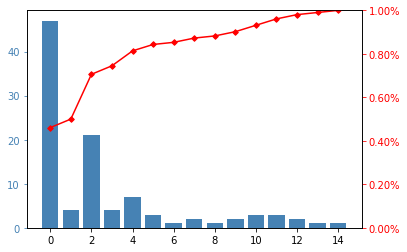

Accuracy 0: 0.46078431372549017
Accuracy 1: 0.7058823529411764


In [21]:
Results = evaluatemodel(LSTM_tx, features, rot_tokenizer,
                        max_length, test, rot_map, Results)
Results = Results.rename(columns={'model_prev': 'LSTM_text',
                         'model_dif': 'LSTM_text_dif', 'model_Aerr': 'LSTM_text_Aerr'})

# Dispay pareto of error
LSTM_tx_plt_data = pd.DataFrame(
    {'count': Results['LSTM_text_Aerr'].value_counts().sort_index().values})
LSTM_tx_plt_data['cumperc'] = Results['LSTM_text_Aerr'].value_counts(
    normalize=True).sort_index().values.cumsum()

plot_error_pareto(LSTM_tx_plt_data)

### LSTM With images as inputs

#### Images Preprocessing

We still haven't tried to use the image of the cards. Let's extract the features from the images collected from the Card Simulation and adjust the previous model to use them as inputs together with the text data.

In [ ]:
# Start by extracting features from image files and saving in featuels pickle
# load vgg16 model
mVGG16 = VGG16()
# restructure the model (As we need to extract features only, we are eliminating two last dense layers of model)
mVGG16 = Model(inputs=mVGG16.inputs, outputs=mVGG16.layers[-2].output)
# summarize
print(mVGG16.summary())

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [ ]:
# extract features from image
img_features = {}
for img_name in tqdm(os.listdir('PDF_IMAGE_CLIPS')):
    # get UCODE from imagename
    # get Ucode from PDF file name
    UCode = img_name[img_name.find("_U")+1:img_name.find("_U")+9]
    # get Revision from image_name
    Revision = img_name[8:9]
    # load the image from file
    img_path = 'PDF_IMAGE_CLIPS/' + img_name
    image = load_img(img_path, target_size=(224, 224))
    # convert image pixels to numpy array
    image = img_to_array(image)
    # reshape data for model
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    # preprocess image for vgg
    image = preprocess_input(image)
    # extract features
    feature = mVGG16.predict(image, verbose=0)
    # get image ID
    image_id = UCode + Revision
    # store feature
    if image_id not in img_features:
        img_features[image_id] = []
    img_features[image_id].append(feature)

#  Flatten features from all 4 images into one single features array
flat_features = {}
for u in features:
    flat_features[u] = np.concatenate(
        (img_features[u][0][0], img_features[u][1][0], img_features[u][2][0], img_features[u][3][0]))

# Save flat_feature
pickle.dump(flat_features, open(os.path.join('DATA', 'flat_features' +
            datetime.now().strftime('%y%m%d%H%M%S') + '.pkl'), 'wb'))

In [10]:
###############################################################################################################
#                                           KEY CELL                                                          # 
###############################################################################################################

# Carregar Flat Features: flat_features é um stet contendo um array con todos os features retirados das 4 imagensdos PDFs (imagem e detalhes de efeitos)
# Ver "Features from Images"
with open(os.path.join(DATA_FOLDER, 'flat_features_VGG16.pkl'), 'rb') as f:
    flat_features = pickle.load(f)

# criar features maping: cria um set com os features correspondentes aos codigos U do Data Frame 'X'
features_img = {}
for key in X.index:
    features_img[key] = np.concatenate((features[key], flat_features[key]))

# Get dimention of input features for encoder input layer
len(features_img['U1189773A'])


17024

#### Model

In [24]:
# Model Creation
# encoder model
# image feature layers
inputs1 = Input(shape=(17024,))  # columns dimention of feature matrix X
fe1 = Dropout(0.2)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)

# sequence feature layers
inputs2 = Input(shape=(max_length,))
se1 = Embedding(rot_vocab_size, 256, mask_zero=True)(inputs2)
se2 = Dropout(0.2)(se1)
se3 = LSTM(256)(se2)

# decoder model
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(rot_vocab_size, activation='softmax')(decoder2)

LSTM_img = Model(inputs=[inputs1, inputs2], outputs=outputs)
LSTM_img.compile(loss='categorical_crossentropy', optimizer='adam')

LSTM_img.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 17)]         0           []                               
                                                                                                  
 input_3 (InputLayer)           [(None, 17024)]      0           []                               
                                                                                                  
 embedding_1 (Embedding)        (None, 17, 256)      8448        ['input_4[0][0]']                
                                                                                                  
 dropout_2 (Dropout)            (None, 17024)        0           ['input_3[0][0]']                
                                                                                            

In [25]:
# Train the model
epochs = 30
batch_size = 100
steps = len(train) // batch_size
history = []
for i in range(epochs):
    # create data generator
    generator = data_generator(train, rot_map, features_img,
                               rot_tokenizer, max_length, rot_vocab_size, batch_size)
    # fit for one epoch
    hist = LSTM_img.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    history.append(hist.history['loss'][0])
    # if len(history)>4:
    #    if history[-1]>history[-4]:
    #        break

9/9 [==============================] - 1s 102ms/step - loss: 0.2004


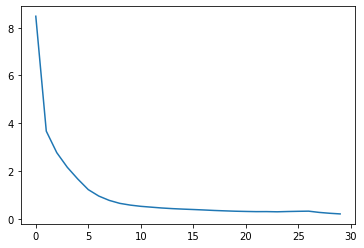

In [26]:
# plot loss history
plt.plot(history)
plt.show()

Loss is still consistently reducing after 30 epochs, let's carry on untill it stops reducing.

In [27]:
epochs = 15
batch_size = 100
steps = len(train) // batch_size
for i in range(epochs):
    # create data generator
    generator = data_generator(train, rot_map, features_img,
                               rot_tokenizer, max_length, rot_vocab_size, batch_size)
    # fit for one epoch
    hist = LSTM_img.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    history.append(hist.history['loss'][0])
    # if len(history)>4:
    #    if history[-1]>history[-4]:
    #        break

9/9 [==============================] - 1s 125ms/step - loss: 0.2093


In [13]:
# plot loss history
plt.plot(history)
plt.show()

NameError: ignored

In [ ]:
Results = evaluatemodel(LSTM_img, features_img, rot_tokenizer,
                        max_length, test, rot_map, Results)


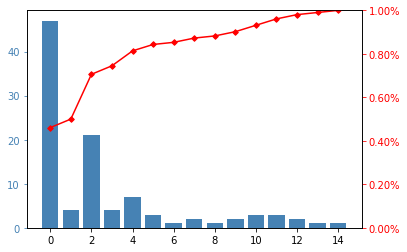

Accuracy 0: 0.46078431372549017
Accuracy 1: 0.7058823529411764


In [33]:

# Dispay pareto of error
LSTM_img_plt_data = pd.DataFrame(
    {'count': Results[LSTM_img.name + '_Aerr'].value_counts().sort_index().values})
LSTM_img_plt_data['cumperc'] = Results[LSTM_img.name + '_Aerr'].value_counts(
    normalize=True).sort_index().values.cumsum()

plot_error_pareto(LSTM_tx_plt_data)

Loss is stabilizing at a high value. Let's add some more neurons in the dense layere to see if network can find better fit:

In [11]:
# Try some variations in the model (double the dense layer)

# Model Creation
# encoder model
# image feature layers
inputs1 = Input(shape=(17024,))  # columns dimention of feature matrix X
fe1 = Dropout(0.2)(inputs1)
fe2 = Dense(512, activation='relu')(fe1)

# sequence feature layers
inputs2 = Input(shape=(max_length,))
se1 = Embedding(rot_vocab_size, 512, mask_zero=True)(inputs2)
se2 = Dropout(0.2)(se1)
se3 = LSTM(512)(se2)

# decoder model
decoder1 = add([fe2, se3])
decoder2 = Dense(512, activation='relu')(decoder1)
outputs = Dense(rot_vocab_size, activation='softmax')(decoder2)

LSTM_img_2 = Model(inputs=[inputs1, inputs2], outputs=outputs)
LSTM_img_2.compile(loss='categorical_crossentropy', optimizer='adam')

LSTM_img_2.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 17)]         0           []                               
                                                                                                  
 input_1 (InputLayer)           [(None, 17024)]      0           []                               
                                                                                                  
 embedding (Embedding)          (None, 17, 512)      16896       ['input_2[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 17024)        0           ['input_1[0][0]']                
                                                                                              

18/18 [==============================] - 1s 46ms/step - loss: 0.1836


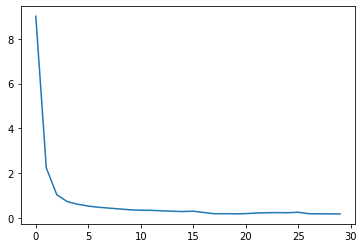

In [12]:
epochs = 30
batch_size = 50
steps = len(train) // batch_size
history_2 = []
for i in range(epochs):
    # create data generator
    generator = data_generator(train, rot_map, features_img,
                               rot_tokenizer, max_length, rot_vocab_size, batch_size)
    # fit for one epoch
    hist = LSTM_img_2.fit(generator, epochs=1,
                          steps_per_epoch=steps, verbose=1)
    history_2.append(hist.history['loss'][0])
    if len(history_2) > 4:
        if history_2[-1] == min(history_2):
            LSTM_img_2.save(DATA_FOLDER + 'best_model_230106_i.h5')

# plot loss history
plt.plot(history_2)
plt.show()

In [14]:
min(history_2)

0.18356077373027802

In [ ]:
LSTM_img_2 = load_model(DATA_FOLDER + 'best_model_230106_i.h5')

  0%|          | 0/102 [00:00<?, ?it/s]

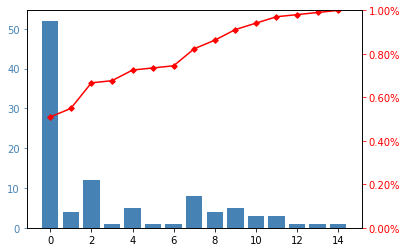

Accuracy 0: 0.5098039215686274
Accuracy 1: 0.6666666666666666


In [15]:
# validate with test data

Results = evaluatemodel(LSTM_img_2, features_img,
                        rot_tokenizer, max_length, test, rot_map, Results)

# Dispay pareto of error
LSTM_img_2_plt_data = pd.DataFrame(
    {'count': Results[LSTM_img_2.name + '_Aerr'].value_counts().sort_index().values})
LSTM_img_2_plt_data['cumperc'] = Results[LSTM_img_2.name +
                                         '_Aerr'].value_counts(normalize=True).sort_index().values.cumsum()

plot_error_pareto(LSTM_img_2_plt_data)

With the same 30 epochs as in the model without images, we've reached a slightly worst result. But at the same time the number of parameters to be trained went from 772,129 to 4,966,433. Let's try 30 more epochs...

18/18 [==============================] - 1s 44ms/step - loss: 0.0414


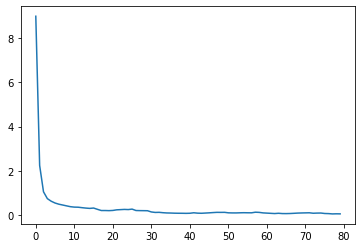

In [16]:
epochs = 50
batch_size = 50
steps = len(train) // batch_size

for i in range(epochs):
    # create data generator
    generator = data_generator(train, rot_map, features_img,
                               rot_tokenizer, max_length, rot_vocab_size, batch_size)
    # fit for one epoch
    hist = LSTM_img_2.fit(generator, epochs=1,
                          steps_per_epoch=steps, verbose=1)
    history_2.append(hist.history['loss'][0])
    if len(history_2) > 4:
        if history_2[-1] == min(history_2):
            LSTM_img_2.save(
                DATA_FOLDER + 'best_model_230124_' + str(i) + '.h5')

# plot loss history
plt.plot(history_2)
plt.show()


In [19]:
print('lowest loss:', min(history_2))

lowest loss: 0.039069805294275284


  0%|          | 0/102 [00:00<?, ?it/s]

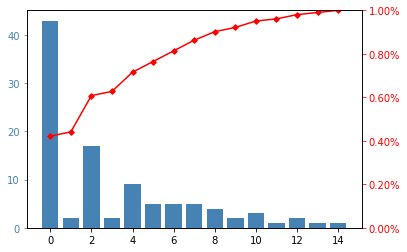

Accuracy 0: 0.4215686274509804
Accuracy 1: 0.6078431372549019


In [18]:
###############################################################################################################
#                                           KEY CELL                                                          # 
###############################################################################################################

# Loading the best loss model:
LSTM_img_2 = load_model(DATA_FOLDER + "best_model_230124_47.h5")

Results = evaluatemodel(LSTM_img_2, features_img,
                        rot_tokenizer, max_length, test, rot_map, Results)
Results = Results.rename(columns={
                         'model_prev': 'LSTM_img', 'model_dif': 'LSTM_img_dif', 'model_Aerr': 'LSTM_img_Aerr'})

# Dispay pareto of error
LSTM_img_2_plt_data = pd.DataFrame(
    {'count': Results['LSTM_img_Aerr'].value_counts().sort_index().values})
LSTM_img_2_plt_data['cumperc'] = Results['LSTM_img_Aerr'].value_counts(
    normalize=True).sort_index().values.cumsum()

plot_error_pareto(LSTM_img_2_plt_data)

Lowest loss recorded at epoch 30+36 = 66.

## Result Analysis

Eventhough the accuracy score have improved considerably, there are many reasons why the model may be failing to identify the correct route. We know the model is not supposed to be perfect, we know that our data is not perfect, but certain types of imperfections must be identified and corrected to ensure it's well working of the solution. Investigating the misses case by case can allow us to dig into the details to have a better understanding of the workins of our model and plan a better way forward.

Focusing on the best model we have, let's see where it has made missinterpretations and compare them with the results of other models:

In [ ]:
# Display comparation of results of MLPC and LSTMs for the few errors of LSTM_img
print('Total de erros:', len(Results[Results['LSTM_img_Aerr'] > 0].sort_values(
    'LSTM_img_Aerr', ascending=False)))
display(Results[['Actual', 'MLPC_pred', 'LSTM_text', 'LSTM_text_Aerr', 'LSTM_img', 'LSTM_img_Aerr']][Results['LSTM_img_Aerr'] > 0].sort_values('LSTM_img_Aerr', ascending=False))

Total de erros: 9


,Actual,MLPC_pred,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_Aerr
U1164822A,"<10-H,20-H>",<10-H>,<10-H>,0.5,"<10-S,20-S,30-H,40-H,50-H,60-S,70-S>",8.5
U1184456A,"<10-S,20-H>","<10-S,20-H>","<10-S,20-S,30-H>",1.0,"<10-S,20-S,30-S,40-S,50-H,60-H>",5.5
U1163985A,<10-H>,"<10-H,20-H,30-S>",<10-H>,0.0,"<10-H,20-H,30-S>",2.0
U1191635A,"<10-S,20-S,30-S,40-H,50-S>","<10-S,20-S,30-S,40-H,50-S>","<10-S,20-S,30-H,40-S>",2.0,"<10-S,20-S,30-H,40-S>",2.0
U1184338B,"<10-S,20-H>","<10-S,20-H>",<10-H>,1.0,"<10-H,20-H>",1.5
U1190207A,"<10-S,20-H>","<10-S,20-H>",<10-H>,1.0,<10-H>,1.0
U1185687C,"<10-S,20-H>","<10-S,20-H>","<10-S,20-S,30-H,40-S>",2.0,<10-H>,1.0
U1186017A,<10-H>,<10-H>,<10-H>,0.0,"<10-H,20-H>",0.5
U1189247A,<10-H>,<10-H>,<10-H>,0.0,"<10-H,20-H>",0.5


Note that only three u-code have been missed by all models. The MLPC network has performed pretty well on the ucodes missinterpred by LSTM_img.
Let's print the details and then go through case-by case:

### Analysis of misses:

#### U1164822A

,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1164822A,"<10-H,20-H>",<10-H>,0.5,"<10-S,20-S,30-H,40-H,50-H,60-S,70-S>",4S1H,8.5


U1164822A ['FACE\nCMYK\n1375\n165\n2035\n \nREVERSE\nCMYK\n2144\n299\n2172\n', 'PVC - White PVC', 'NA - NA']


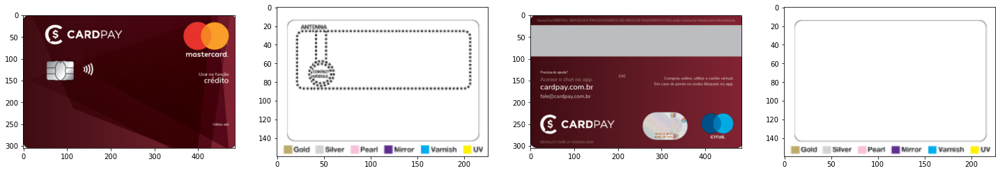

In [ ]:
print_code_details('U1164822A',Results, text_data)

Interesting to see that although al models got it wrong, the LSTM model with image is the one with the bigest error. Lets look at this prediction in details:

In [ ]:
print(predict_script_single('U1164822A', LSTM_img_2, rot_tokenizer, features_img, max_length=17, in_text='<'))

('< 10-S 20-S 30-H 40-H 50-H 60-S 70-S >', [0.7514118, 0.60360575, 0.999047, 0.9987802, 0.98863876, 0.99987197, 0.9984841, 0.9988689])


As we can see, the first and second silk screen operation have a much lower certainty level when copared with the rest. Let's force an Offset operation instead:

In [ ]:
print(predict_script_single('U1164822A', LSTM_img_2, rot_tokenizer, features_img, max_length=17, in_text='< 10-S 20-H'))

('< 10-S 20-H >', [0.5843123])


We can see that now, the script suggeted is much closer to the actual script, and it actually matches the result of the text-only LSTM model. WHat if we push and offse as the first operation?

In [ ]:
print(predict_script_single('U1164822A', LSTM_img_2, rot_tokenizer, features_img, max_length=17, in_text='< 10-H'))

('< 10-H 20-H >', [0.9789379, 0.9913573])


That's more like it.

We can see that although the final result was pretty bad, it was all due to a first decision taken (the first operation) incorrectly, but with a low degree of certainty

* NOTE OF IMPROVEMENT: adapt the prediction model to return a certainty level as it may be an indication of a bad choice.

#### U1184456A

,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1184456A,"<10-S,20-H>","<10-S,20-S,30-H>",1.0,"<10-S,20-S,30-S,40-S,50-H,60-H>",3S1H,5.5


U1184456A ['FRENTE:\n108\n286\n7405\nWhite\n————\nREVERSE:\n108\n286\n280\nBlack\nWhite\n', 'PVC - Yellow PVC PMS 116 123', 'NA - NA']


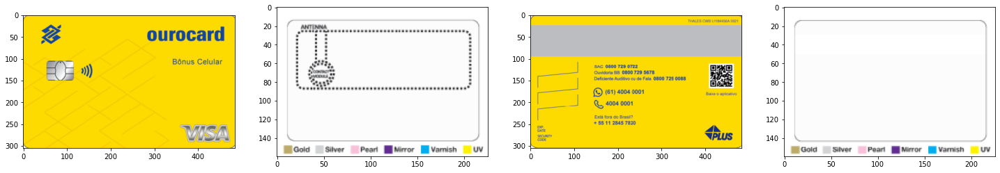

In [ ]:
print_code_details('U1184456A',Results, text_data)

Here we see, once again, that although the other two models have got the correct result, the LSTM_img model has got it wrong:

In [ ]:
print(predict_script_single('U1184456A', LSTM_img_2, rot_tokenizer, features_img, max_length=17, in_text='<'))

('< 10-S 20-S 30-S 40-S 50-H 60-H >', [0.9999958, 0.63066834, 0.70948243, 0.9699423, 0.9950589, 0.99994516, 0.9994172])


There we can see that the second operation was guessed with a prety low level of certainty. Let's push for an offset operation instead of a second silk-screen:

In [ ]:
print(predict_script_single('U1184456A', LSTM_img_2, rot_tokenizer, features_img, max_length=17, in_text='< 10-S 20-H'))

('< 10-S 20-H >', [0.9989378])


Once again, what looks like a very big error is actually the result of one bad decision in the second operation.

#### U1163985A

,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1163985A,<10-H>,<10-H>,0.0,"<10-H,20-H,30-S>",1S1H,2.0


U1163985A ['FACE: \nCMYK\n485C\n506C\nWarm Gray 2C\n2035C\n165C\n1375C\n \nREVERSE:\nBlack\nWarm Gray 2C\nWhite PostPrint\n', 'PVC - White PVC', 'NA - NA']


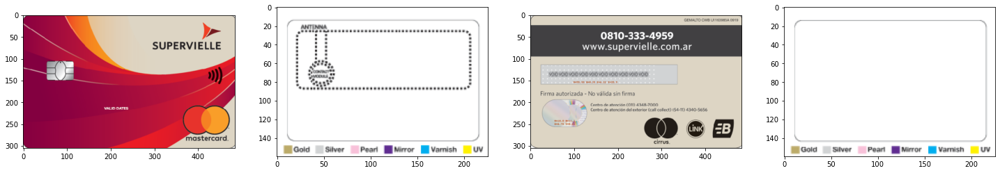

In [ ]:
print_code_details('U1163985A', Results, text_data)

In [ ]:
print(predict_script_single('U1163985A', LSTM_img_2, rot_tokenizer, features_img, max_length=17, in_text='<'))

('< 10-H 20-H 30-S >', [0.99978155, 0.9812847, 0.9723714, 0.999879])


Here we see that all operations were guesseed with a pretty good level of certainty, but it was wrong. In fact, all models have guessed it wrong with the same exact script. That makes us question our data.
In fact, if you look ate the image of the back of the card, we see that there is a white text printed over the black magnetic stripe of the card. The only way to achieve this result is by adding an extra silk-screen pass after the card is laminated. This means that the actual script '<10-H>' must be incorrect. It shoud be, as a minimum a <10-H,20-S> if printed in the front & back process, or a <10-H,20-H,30-S> as guessed by all three models, if printed using the standar two entry process.

* NOTE: See "Important considerations regarding printing process changes during the period of this study": 


#### U1191635A

,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1191635A,"<10-S,20-S,30-S,40-H,50-S>","<10-S,20-S,30-H,40-S>",2.0,"<10-S,20-S,30-H,40-S>",1S0H,2.0


U1191635A ['FACE:\n158\n280\n180\n2035/165/1375\nPearlescent\nWhite\n-\nREVSERSE:\n280\nPearlescent\nWhite\n', 'RPVC85 - 85% Recycled PVC', 'NA - NA']


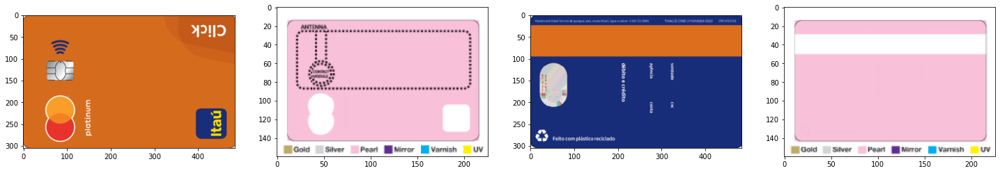

('< 10-S 20-S 30-H 40-S >', [0.9999981, 0.9978588, 0.9957339, 0.978563, 0.99976677])


In [ ]:
print_code_details('U1191635A', Results, text_data)
print(predict_script_single('U1191635A', LSTM_img_2, rot_tokenizer, features_img, max_length=17, in_text='<'))

Here we see the MLPC getting it wright and the two other models agreeing on a script with one less silk-screen operation in the beguinning (1st, 2nd or 3rd operation).
If we dig deep into the details of the printing process, this card follows the following script:
- 10-S: Maraflex lamination varnish for Recycled PVC (internal part of sheets)
- 20-S: Perlescent layer (shown in pink in the effect pictuires)
- 30-S: Maraflex transparent varnish (????)
- 40-H: 6 color hexacromy standard printing (Orange/Yellow/Blue/Magenta/Cyan/Black)
- 50-S: White for text

After some investigation, we figure that the 30-S operation with transparent varnish has been added to the script folowwing an issue with the original script that did not have this step. That may explain the mistake (learning with other variation of similar artworks that do not contain this extra SS).

#### U1184338B

,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1184338B,"<10-S,20-H>",<10-H>,1.0,"<10-H,20-H>",1S1H,1.5


U1184338B ['***FRENTE:\n(O) CMYK\n \n***DORSO:\n(O) CMYK\n', 'PVC - White PVC', 'NA - NA']


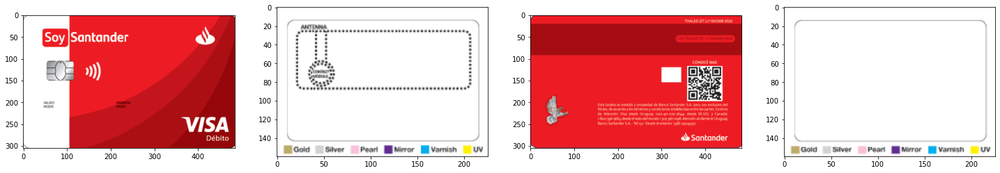

('< 10-H 20-H >', [0.99683267, 0.9960776, 0.9964228])


In [ ]:
print_code_details('U1184338B', Results, text_data)
print(predict_script_single('U1184338B', LSTM_img_2, rot_tokenizer, features_img, max_length=17, in_text='<'))

Interesting to see that the MLPC network has got it right and the two recurrent networks agreed on the same script.

In fact, this card shold be printed with one single pass of offset in a front and back operation. In the past (before front and back, the correct process was <10-H,20-H>. The reason why we have a <10-S> before the offset press is a punctual quality issue with a PVC supplier. PVC comming frm china has a lower surface tension than our PVC from Italy (new sullier developed due to COVID19 crisis od supply). That requires an extra silk-screen pass before any printing. The information about which PVC supply is used is not available in the Card Simulaton document.

NOTE: See "Important considerations regarding process changes during the study".

#### U1190207A, U1185687C, U1186017A, U1189247A

All those cards fall in the same mistake, eithre missing an initial Silkscreen pass in the beguinning or duplicating offset passes for when front/back process was not the rule.

,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1190207A,"<10-S,20-H>",<10-H>,1.0,<10-H>,1S0H,1.0


U1190207A ['FACE:\nCMYK\n108 C\n286 C\n280 C\n \nREVERSE:\nCMYK\n \n', 'PVC - White PVC', 'NA - NA']


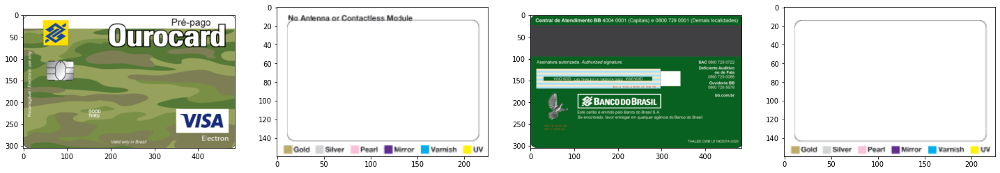

('< 10-H >', [0.999895, 0.7713968])


,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1185687C,"<10-S,20-H>","<10-S,20-S,30-H,40-S>",2.0,<10-H>,1S0H,1.0


U1185687C ['Face:\n485 C\nBlack C\nCMKY\n-\nReverse:\nCMYK\n \n', 'RPVC85 - 85% Recycled PVC', 'NA - NA']


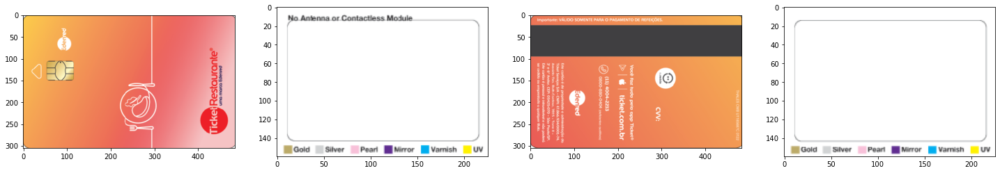

('< 10-H >', [0.9947404, 0.5064422])


,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1186017A,<10-H>,<10-H>,0.0,"<10-H,20-H>",0S1H,0.5


U1186017A ['FACE:\nCMYK\n \nREVERSE:\nCYK\n', 'PVC - White PVC', 'NA - NA']


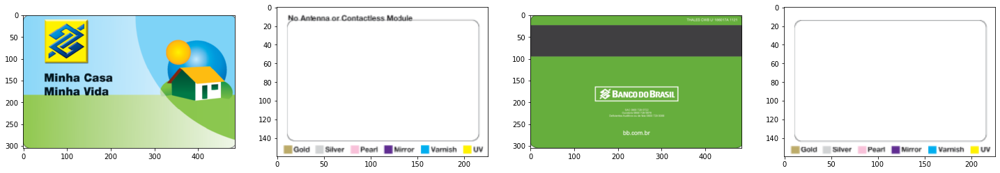

('< 10-H 20-H >', [0.9999435, 0.92317545, 0.9971347])


,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1189247A,<10-H>,<10-H>,0.0,"<10-H,20-H>",0S1H,0.5


U1189247A ['Face:\n485 C\nBlack C\nCMYK\n-\nReverse:\nCMYK\n \n', 'PVC - White PVC', 'NA - NA']


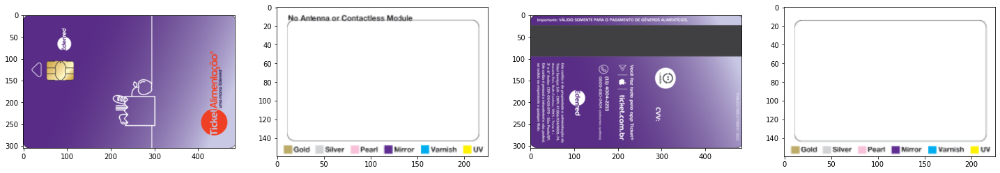

('< 10-H 20-H >', [0.969506, 0.5182076, 0.9999795])


In [ ]:
ucodes = ['U1190207A', 'U1185687C', 'U1186017A', 'U1189247A']
for ucode in ucodes:
    print_code_details(ucode, Results, text_data)
    print(predict_script_single(ucode, LSTM_img_2, rot_tokenizer, features_img, max_length=17, in_text='<'))

### Statistical evaluation of prediction

Although we are achievig a pretty good level of correct predictions, the close evaluation of the misses have raised one important quastions that may not be answerable with a one by one analysis. We cans see that most of the misses (7 out of 9) are in artwork with revision A. Does it mean that we do have more A revision items in the population or that the model struggles to guess the correct script for brand new developed artworks more than with evolution of existing artworks? Could the model be "cheating" by copying the scripts of previous or later evolution of the same artwork? It is well possible that when there is a minor evolution of a u-Code, the model is very capable of identifying identical text descriptions and almost-identicle artworks and simply 'copy' the script from one to the other. If this is the case, we shuold see more true positives in cases when among the training data we can find previous or later evolution of ucode. The dificulty of this analysis is that we may have the exact same artork in diferente u-codes when there is an evolution in any other technology in the product (antena manufacturer or chip manufacturer). That means we may struggle to identify this kind of similarity (see Notes on Introduction/Project Breakdown/Collecting and Preparing the Data).

Note: This hypothesis does not invalidate the model, once looking for similarities in the artworks is a valid way of finding the correct script. The questionmark is more in terms of understanding if there is a greater risk of geting it wrong when there is a brand-new artwork being developed.

#### Single version UCode occurances on test and train data

Let's go back to the X data and tag the ucodes that have multiple revisions and then map them back on the train and test data we have used for thie model evaluation:

In [ ]:
###############################################################################################################
#                                           KEY CELL                                                          # 
###############################################################################################################

# Separating U-Code and revision from indexes
X_ucode = []
X_revision = []
for u in X.index:
    X_ucode.append(u[0:8])
    X_revision.append(u[8:9])

X_df = pd.concat([pd.DataFrame(data=X_ucode, columns=['UCode']), pd.DataFrame(
    data=X_revision, columns=['Revision'])], axis=1).set_index(X.index)

In [ ]:
# Identify if Ucode has revisions or not
revisions = []
for ucode in X_df.index:
    if ucode[0:8] in list(X_df.UCode.value_counts()[X_df.UCode.value_counts().values == 1].index):
        revisions.append(0)
    else:
        revisions.append(1)
X_df['has_revision'] = revisions

# Identifying the ucodes in test that are positive and negative

in_test = []
for u in X_df.index:
    if u in test:
        in_test.append(1)
    else:
        in_test.append(0)
X_df['InTest'] = in_test

positive = Results[Results['LSTM_img_Aerr'] == 0].index

in_positive = []
for u in X_df.index:
    if u in positive:
        in_positive.append(1)
    else:
        in_positive.append(0)
X_df['InPositive'] = in_positive

negative = Results[Results['LSTM_img_Aerr'] > 0].index

in_negative = []
for u in X_df.index:
    if u in negative:
        in_negative.append(1)
    else:
        in_negative.append(0)
X_df['InNegative'] = in_negative

In [ ]:
print('Single revision in population:', '{:.3g}%'.format(
    list(X_df['has_revision'].values).count(0)/len(X_df)*100))
print('Single revision in test data :', '{:.3g}%'.format(list(
    X_df[X_df['InTest'] == 1]['has_revision'].values).count(0)/len(X_df[X_df['InTest'] == 1])*100))
print('Single revision in test positive :', '{:.3g}%'.format(list(
    X_df[X_df['InPositive'] == 1]['has_revision'].values).count(0)/len(X_df[X_df['InPositive'] == 1])*100))
print('Single revision in test negative :', '{:.3g}%'.format(list(
    X_df[X_df['InNegative'] == 1]['has_revision'].values).count(0)/len(X_df[X_df['InNegative'] == 1])*100))


Single revision in population: 64.1%
Single revision in test data : 65.7%
Single revision in test positive : 63.4%
Single revision in test negative : 88.9%


Here we can confirm that 8 out of 9 misses have happened on cards with no previous or later revisions in the train data.
In the other hand, we can also see that 63%.4 of the correct preditions, were made on cards with no previous or later revision in the train data. This is a little lower than the prortion of cards with no revisions in all population, but not a lot lower.

We may have to consider there may be identical, or almost identical PDFs with diferent u-codes in the train and test data. We can evaluate that comparing the features (X) of the diferent u codes and identifying the cards that are identical and closer to each other. As we have something like 14k dimentions in our data, we better compare similarities by a distance calculation method. Euclidean distances should make the job.

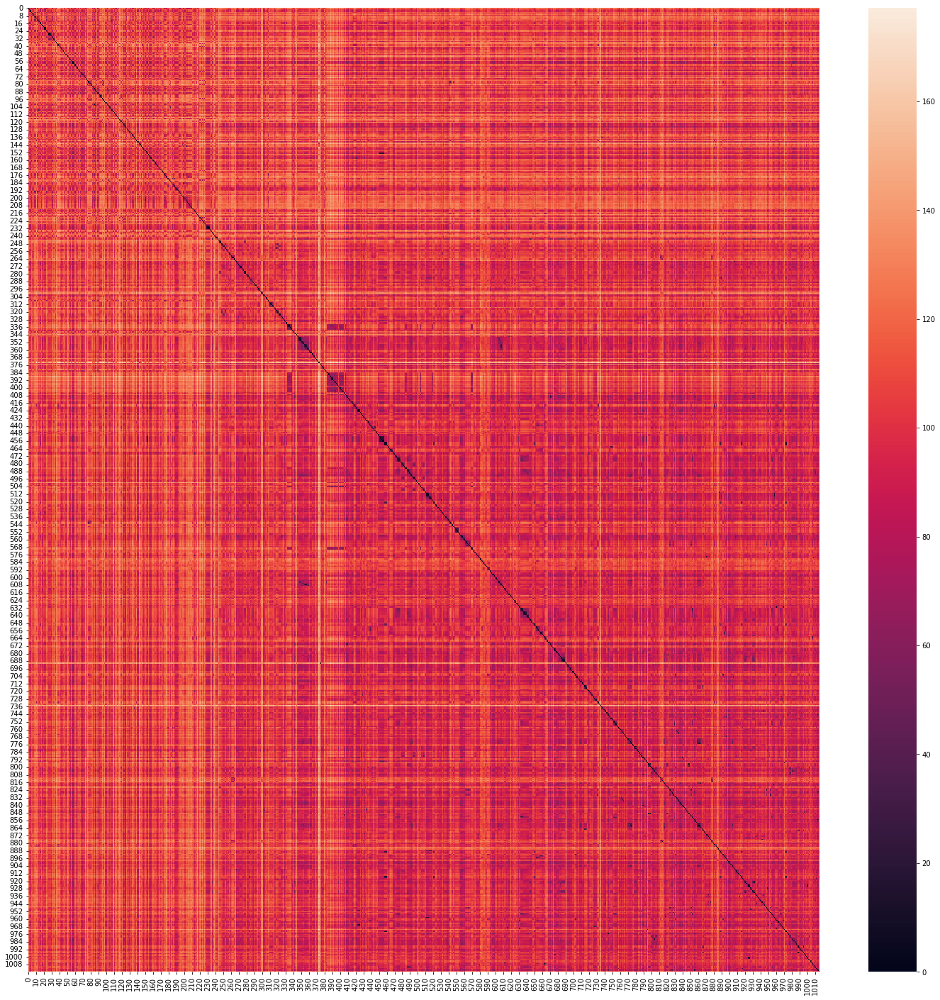

In [ ]:
###############################################################################################################
#                                           KEY CELL                                                          # 
###############################################################################################################

distances = pairwise_distances(list(features_img.values()), metric='euclidean')
fig, ax = plt.subplots(figsize=(25, 25))
ax = sns.heatmap(distances)
plt.show()

Maximum: 177.15571346160868
Minimum: 1.9073486328125e-06
Maximum diagonal: 1.4273290202232137e-05
Average: 103.17862543725933
Mean: 103.17862543725933
Standard dev: 16.829475450359666
Average - 3s: 52.69019908618033
Average + 3s: 153.6670517883383


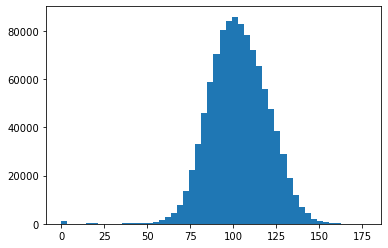

In [ ]:
#Analysin in detail

print('Maximum:', np.max(distances))
print('Minimum:', np.min(distances[np.nonzero(distances)]))
print('Maximum diagonal:', max(np.diagonal(distances)))
print('Average:', np.average(distances))
print('Mean:', np.mean(distances))
print('Standard dev:', np.std(distances))
print('Average - 3s:', np.average(distances) - 3*np.std(distances))
print('Average + 3s:', np.average(distances) + 3*np.std(distances))

# Flatten the array to 1-dimensional
arr_flat = distances.flatten()

# Plot a histogram of the values
plt.hist(arr_flat, bins=50)
plt.show()

Here we can see that most ucodes are distant from each other by something between 50 and 150.

most common: U1164113E 17


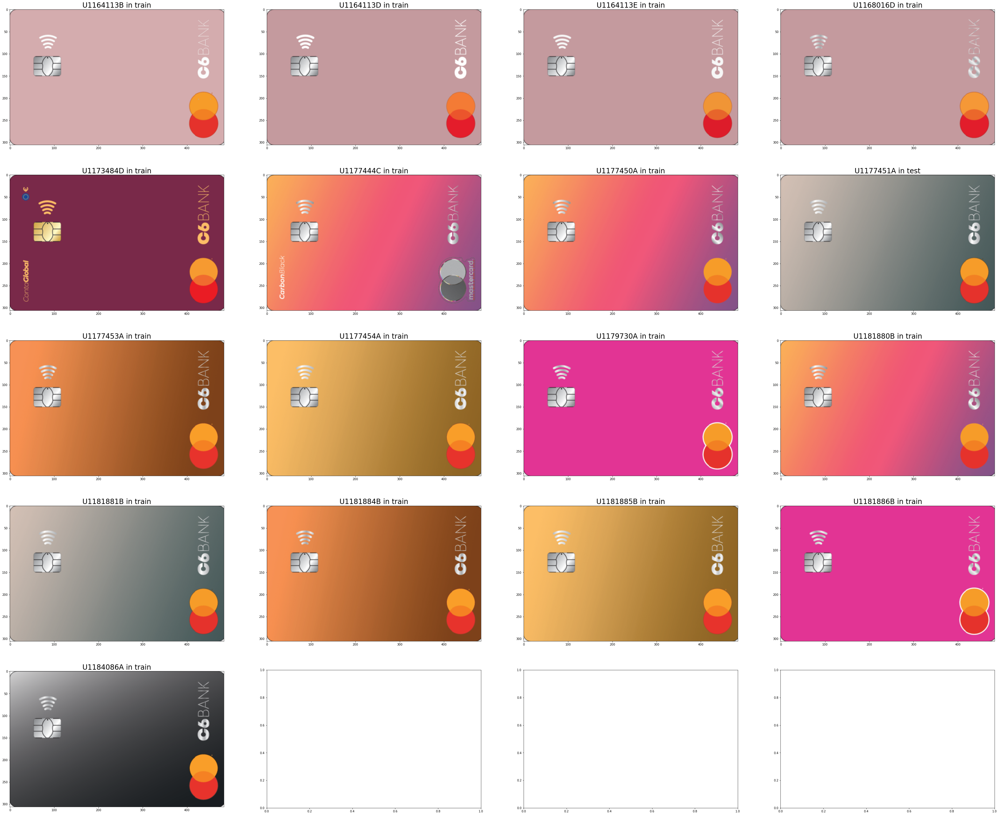

------------------------------------------------------------------------------------------------------------------------------------------------------
most exotic: U1159800A


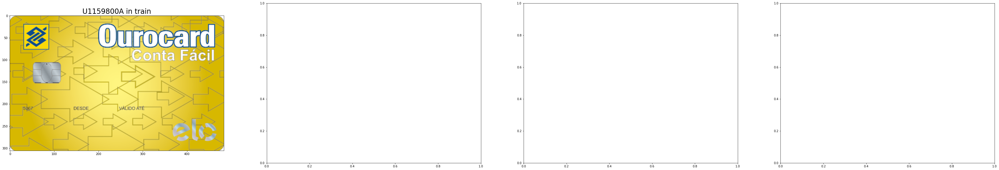

In [ ]:
# find more common and less common code '
# - most common is card that contains more cards bellow 'commonality treshold (thc= av-3s)
# - most exotc is card that contains more cards abve the (av+3s)

common = distances[0]
ic = 0
exotic = distances[0]
i = 0
ie = 0
the = np.average(distances)+3*np.std(distances)
thc = np.average(distances)-3*np.std(distances)
for d in distances:
    if len(d[d < thc]) > len(common[common < thc]):
        common = d
        ic = i
    if len(d[d > the]) > len(exotic[exotic > the]):
        exotic = d
        ie = i
    i = i+1

keys = []
for value in list(common[common < thc]):
    indice = np.where(common == value)
    key = list(features_img.keys())[indice[0][0]]
    keys.append(key)

print('most common:', list(features_img.keys())[ic], len(common[common < thc]))
print_faces(keys, test)

print(150 * '-')

print('most exotic:', list(features_img.keys())[ie])
print_faces([list(features_img.keys())[ie]], test)


most common: U1184004A  average distance: 86.10280322272533


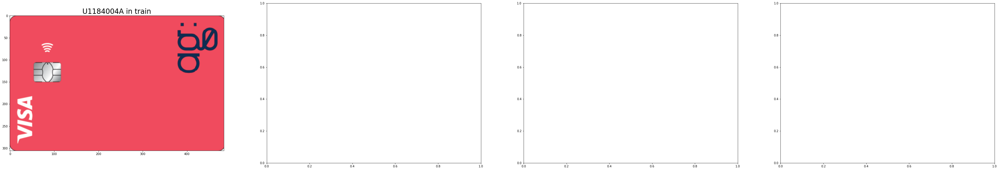

------------------------------------------------------------------------------------------------------------------------------------------------------
most exotic: U1159800A  average distance: 145.9680981597509


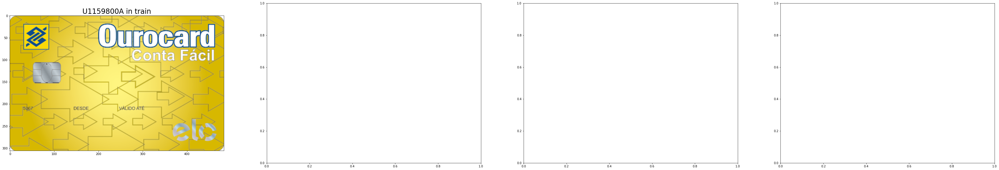

In [ ]:
# likewise, see card with lowest added distance and with largest added distances

common = distances[0].sum()
ic = 0
exotic = distances[0].sum()
i = 0
ie = 0
for d in distances:
    if d.sum() < common:
        common = d.sum()
        ic = i
    if d.sum() > exotic:
        exotic = d.sum()
        ie = i
    i = i+1


print('most common:', list(features_img.keys())[
      ic], ' average distance:', np.average(distances[ic]))
print_faces([list(features_img.keys())[ic]], test)

print(150 * '-')

print('most exotic:', list(features_img.keys())[
      ie], ' average distance:', np.average(distances[ie]))
print_faces([list(features_img.keys())[ie]], test)

#### DB Clustering 

The evaluation of the eucledian distance seem interesting but we want to see how each artwor relates to each other with regards the features matrix. For that we will analyse the grouping of images by clustering them.

In [ ]:
###############################################################################################################
#                                           KEY CELL                                                          # 
###############################################################################################################

X_IMG = list(features_img.values())
eps = np.average(distances)-3*np.std(distances)
clustering = DBSCAN(eps, min_samples=2, metric='euclidean').fit(X_IMG)
labels = clustering.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('eps:', eps)
print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

labels = np.array(labels)

eps: 52.69019908618033
Estimated number of clusters: 168
Estimated number of noise points: 351


In [ ]:
# see largest clauster:

cluster_sizes = []
for i in range(n_clusters_):
    cluster_sizes.append(len(labels[labels == i]))
indexes = np.where(labels == np.argsort(cluster_sizes)[-1])
ucodes = []
for i in indexes[0]:
    ucodes.append(list(features_img.keys())[i])
print_faces(ucodes, test)

This is far too large, it's includding too many diferent cards. Lets reduce the distance a bit:

In [ ]:
eps = np.average(distances)-3.5*np.std(distances)
clustering = DBSCAN(eps, min_samples=2, metric='euclidean').fit(X_IMG)

labels = clustering.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('eps:', eps)
print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

labels = np.array(labels)

# see largest clauster:

cluster_sizes = []
for i in range(n_clusters_):
    cluster_sizes.append(len(labels[labels == i]))
indexes = np.where(labels == np.argsort(cluster_sizes)[-1])
ucodes = []
for i in indexes[0]:
    ucodes.append(list(features_img.keys())[i])
print_faces(ucodes, test)

So clustering the cards with an eps closer to 3.5S (45), it will clearly cluster similar but not identical artworks.
Let's find the correct parameter to find more similar artworks

In [ ]:
X_IMG = list(features_img.values())
eps = np.average(distances)-4*np.std(distances)
clustering = DBSCAN(eps, min_samples=2, metric='euclidean').fit(X_IMG)

labels = clustering.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('eps:', eps)
print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

labels = np.array(labels)

# see largest clauster:

cluster_sizes = []
for i in range(n_clusters_):
    cluster_sizes.append(len(labels[labels == i]))
indexes = np.where(labels == np.argsort(cluster_sizes)[-1])
ucodes = []
for i in indexes[0]:
    ucodes.append(list(features_img.keys())[i])
print_faces(ucodes, test)

Now lets compare again the total on-target guesses and missed guesses for the cards with similar artworks and for the cards that are "outliers"

Let's first add tp X_df a column identifyfing the Cluster label or ucode if it's an outlier and compare populatios by belonging and no belonging to clusters:

In [ ]:
ucodes = np.array(list(features_img.keys()))
cluster = []
for ucode in X_df.index:
    l_index = np.where(ucodes == ucode)[0][0]
    label = labels[l_index]
    cluster.append(label)
X_df['Label'] = cluster

print('Outliers in population:', '{:.3g}%'.format(
    list(X_df['Label'].values).count(-1)/len(X_df)*100))
print('Outliers in test data :', '{:.3g}%'.format(list(
    X_df[X_df['InTest'] == 1]['Label'].values).count(-1)/len(X_df[X_df['InTest'] == 1])*100))
print('Outliers in test positive :', '{:.3g}%'.format(list(
    X_df[X_df['InPositive'] == 1]['Label'].values).count(-1)/len(X_df[X_df['InPositive'] == 1])*100))
print('Outliers in test negative :', '{:.3g}%'.format(list(
    X_df[X_df['InNegative'] == 1]['Label'].values).count(-1)/len(X_df[X_df['InNegative'] == 1])*100))


Outliers in population: 51.4%
Outliers in test data : 51%
Outliers in test positive : 52.7%
Outliers in test negative : 33.3%


It looks like the model has a better performance if there is no similar ucode in the train data (noise). This may be because of the minor changes in process due to technology or material changes explainde in the Introduction/ Project Brakdown section (see Notes). 

Lets examine the script for the clustered cards on the missed list.

Now let's go back to the Results analysis and take a look at the cluster each of the misses belong too and closely analyse case by case

,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1164822A,"<10-H,20-H>",<10-H>,0.5,"<10-S,20-S,30-H,40-H,50-H,60-S,70-S>",4S1H,8.5


U1164822A ['FACE\nCMYK\n1375\n165\n2035\n \nREVERSE\nCMYK\n2144\n299\n2172\n', 'PVC - White PVC', 'NA - NA']


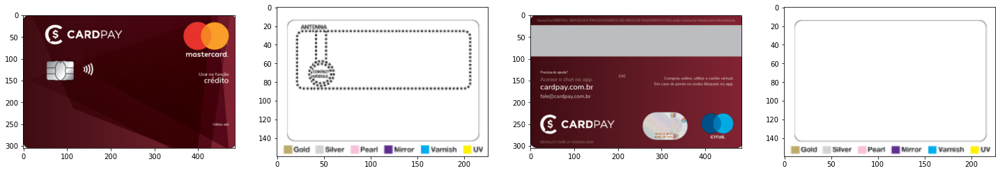

CLUSTER LABEL: 109


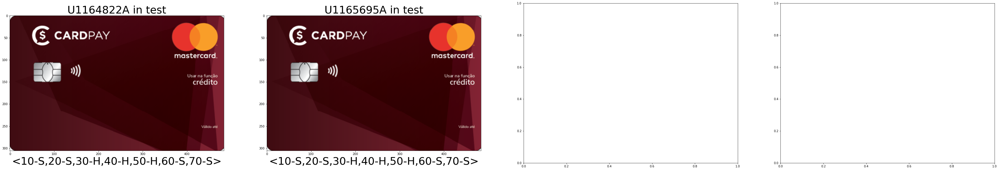

______________________________________________________________________________________________________________________________________________________


,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1184456A,"<10-S,20-H>","<10-S,20-S,30-H>",1.0,"<10-S,20-S,30-S,40-S,50-H,60-H>",3S1H,5.5


U1184456A ['FRENTE:\n108\n286\n7405\nWhite\n————\nREVERSE:\n108\n286\n280\nBlack\nWhite\n', 'PVC - Yellow PVC PMS 116 123', 'NA - NA']


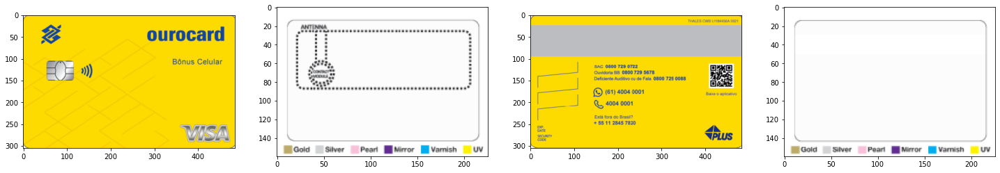

CLUSTER LABEL: 54


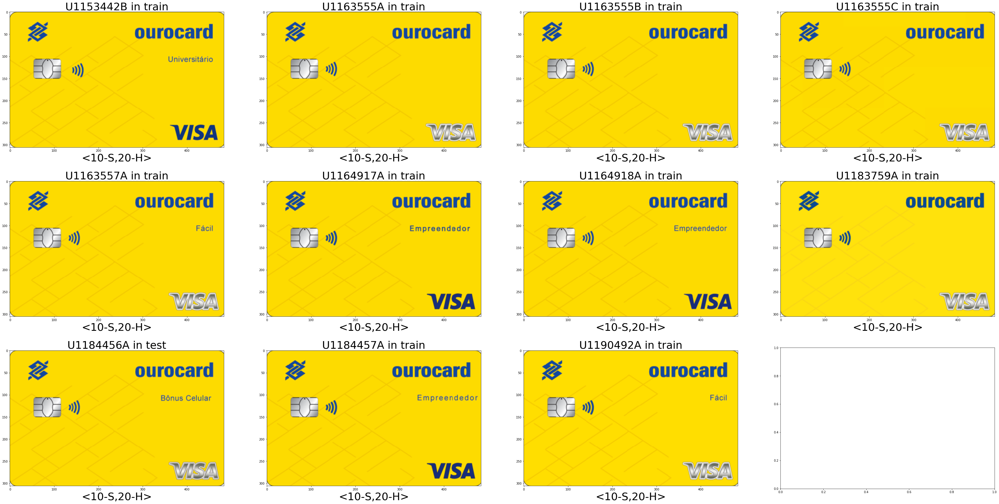

______________________________________________________________________________________________________________________________________________________


,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1163985A,<10-H>,<10-H>,0.0,"<10-H,20-H,30-S>",1S1H,2.0


U1163985A ['FACE: \nCMYK\n485C\n506C\nWarm Gray 2C\n2035C\n165C\n1375C\n \nREVERSE:\nBlack\nWarm Gray 2C\nWhite PostPrint\n', 'PVC - White PVC', 'NA - NA']


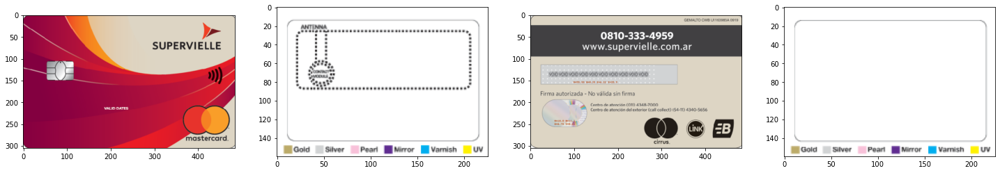

CLUSTER LABEL: 97


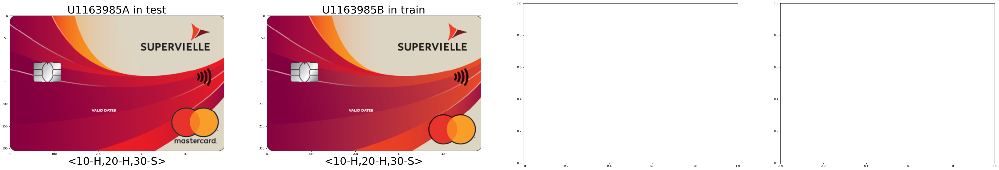

______________________________________________________________________________________________________________________________________________________


,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1191635A,"<10-S,20-S,30-S,40-H,50-S>","<10-S,20-S,30-H,40-S>",2.0,"<10-S,20-S,30-H,40-S>",1S0H,2.0


U1191635A ['FACE:\n158\n280\n180\n2035/165/1375\nPearlescent\nWhite\n-\nREVSERSE:\n280\nPearlescent\nWhite\n', 'RPVC85 - 85% Recycled PVC', 'NA - NA']


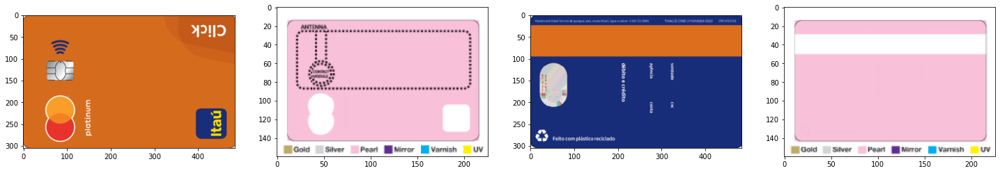

CLUSTER LABEL: 184


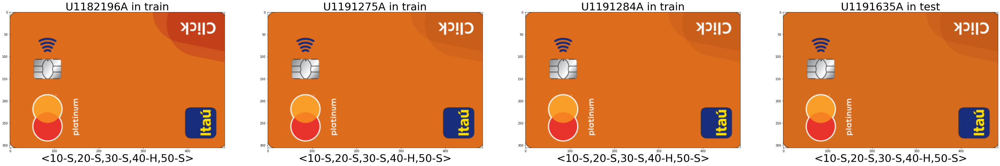

______________________________________________________________________________________________________________________________________________________


,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1184338B,"<10-S,20-H>",<10-H>,1.0,"<10-H,20-H>",1S1H,1.5


U1184338B ['***FRENTE:\n(O) CMYK\n \n***DORSO:\n(O) CMYK\n', 'PVC - White PVC', 'NA - NA']


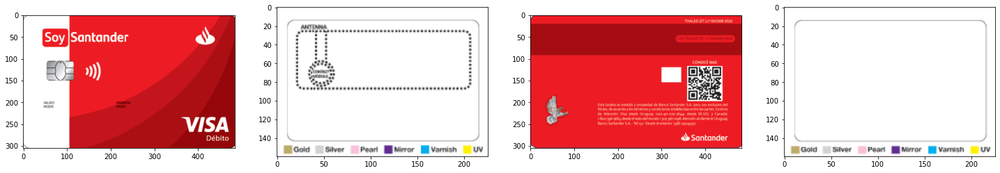

CLUSTER LABEL: 190


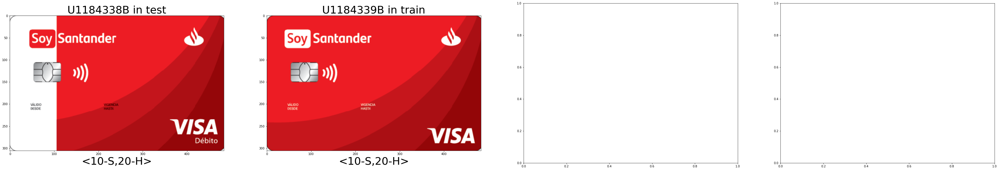

______________________________________________________________________________________________________________________________________________________


,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1190207A,"<10-S,20-H>",<10-H>,1.0,<10-H>,1S0H,1.0


U1190207A ['FACE:\nCMYK\n108 C\n286 C\n280 C\n \nREVERSE:\nCMYK\n \n', 'PVC - White PVC', 'NA - NA']


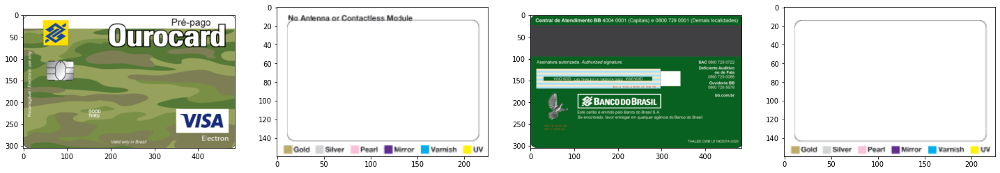

U1190207A is an outlier. Closer ucodes distance: [61.9149649874761, 62.71785405300308, 62.794936389740855]


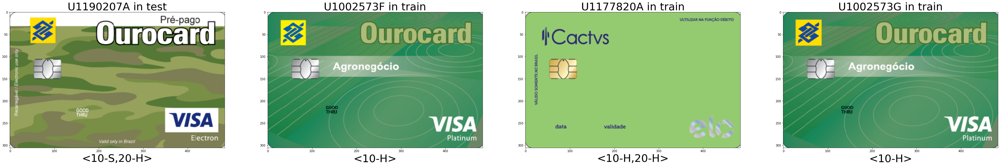

______________________________________________________________________________________________________________________________________________________


,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1185687C,"<10-S,20-H>","<10-S,20-S,30-H,40-S>",2.0,<10-H>,1S0H,1.0


U1185687C ['Face:\n485 C\nBlack C\nCMKY\n-\nReverse:\nCMYK\n \n', 'RPVC85 - 85% Recycled PVC', 'NA - NA']


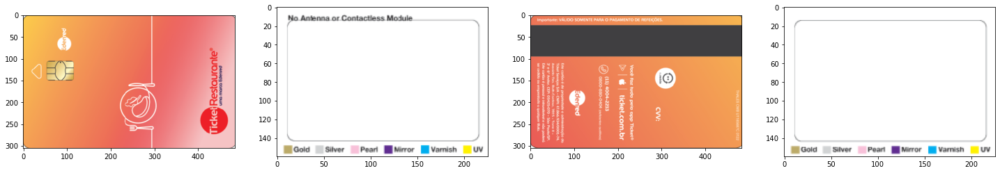

CLUSTER LABEL: 195


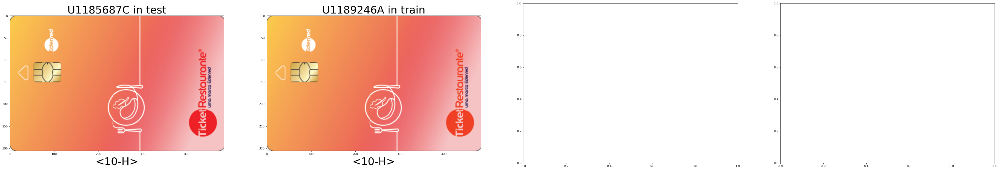

______________________________________________________________________________________________________________________________________________________


,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1186017A,<10-H>,<10-H>,0.0,"<10-H,20-H>",0S1H,0.5


U1186017A ['FACE:\nCMYK\n \nREVERSE:\nCYK\n', 'PVC - White PVC', 'NA - NA']


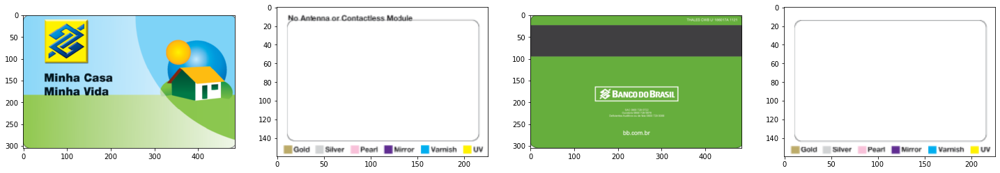

U1186017A is an outlier. Closer ucodes distance: [73.96094927034223, 74.4184493389152, 80.17046524333949]


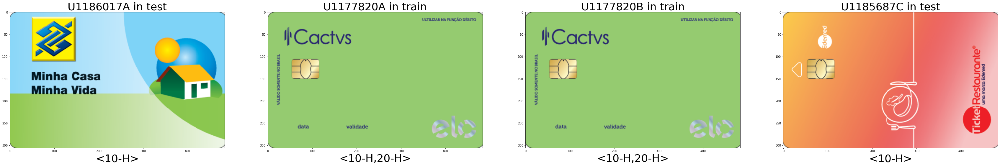

______________________________________________________________________________________________________________________________________________________


,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1189247A,<10-H>,<10-H>,0.0,"<10-H,20-H>",0S1H,0.5


U1189247A ['Face:\n485 C\nBlack C\nCMYK\n-\nReverse:\nCMYK\n \n', 'PVC - White PVC', 'NA - NA']


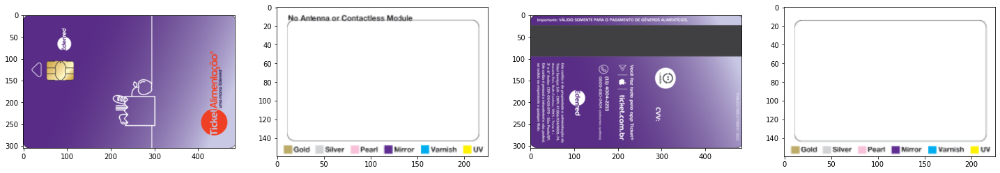

CLUSTER LABEL: 196


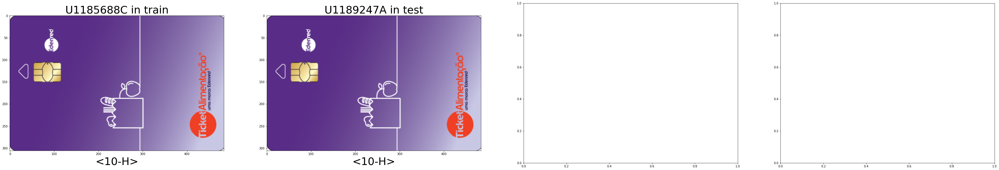

______________________________________________________________________________________________________________________________________________________


In [ ]:
for ucode in Results[Results['LSTM_img_Aerr'] > 0].sort_values('LSTM_img_Aerr', ascending=False).index:
    print_code_details(ucode, Results, text_data)
    print_ucode_cluster(ucode, features_img, labels, distances, y, test)
    print(150*'_')

Now lets analyse the error case by case: 
Fisrt we see that the ucode with the biggest mistake as an identical card (at least the face artwork seems to be) but it is also in the test database. That means the model have never seen this card before trying to predictit.
Lets compare the details of each of them:

,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1164822A,"<10-H,20-H>",<10-H>,0.5,"<10-S,20-S,30-H,40-H,50-H,60-S,70-S>",4S1H,8.5


U1164822A ['FACE\nCMYK\n1375\n165\n2035\n \nREVERSE\nCMYK\n2144\n299\n2172\n', 'PVC - White PVC', 'NA - NA']


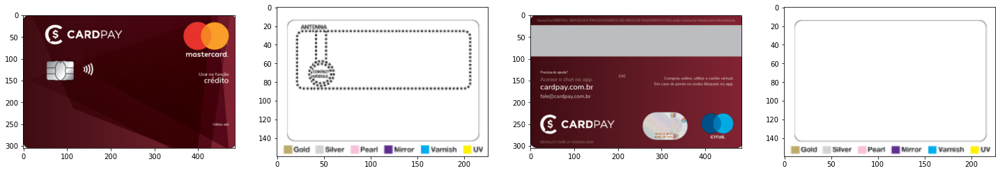

,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1165695A,"<10-S,20-S,30-H,40-H,50-H,60-S,70-S>","<10-S,20-S,30-H,40-H,50-H>",4.0,"<10-S,20-S,30-H,40-H,50-H,60-S,70-S>",0S0H,0.0


U1165695A ['FACE\nCMYK\n1375\n165\n2035\n \nREVERSE\nCMYK\n2144\n299\n2172\n', 'F2WHBS - Fsquare White Bright Silver ', 'NA - NA']


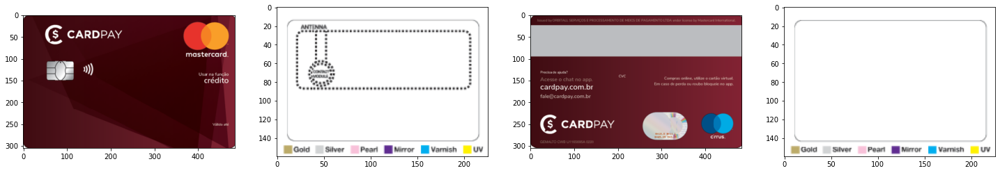

In [ ]:
print_code_details('U1164822A', Results, text_data)
print_code_details('U1165695A', Results, text_data)

Now we can see tht even though the artwork seem to be the same, text data is asking for a diferent type os plastic, a foil pvc. **We can also see that for the card on foil PVC the guessed script is the correct one.**

Let's look for other similar artworks the model may be looking at and understand the right prediction:

closest cards to U1165695A
Distances: [1.5964546004310636, 57.741603327786734, 60.00897895719219, 60.2214932992516]


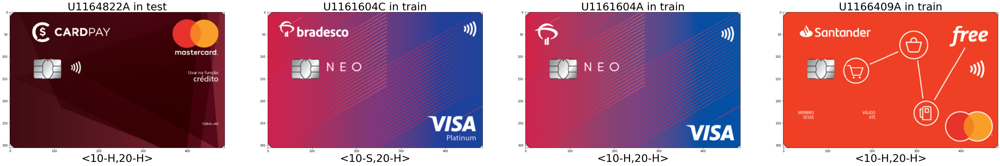

In [ ]:
ref_ucode = 'U1165695A'
ucodes = np.array(list(features_img.keys()))
l_index = np.where(ucodes == ref_ucode)[0][0]

# print ucode and 4 closest cards
ucodes = []
u_dist = []
actuals = []
sorted_indices = np.argsort(distances[l_index])
for i in range(4):
    i_smallest_index = sorted_indices[i+1]
    u_dist.append(distances[l_index][i_smallest_index])
    ucodes.append(list(features_img.keys())[i_smallest_index])
    actuals.append(y[y.index == list(features_img.keys())[i_smallest_index]].newROT.values[0])
print('closest cards to',ref_ucode)
print('Distances:', u_dist)
print_faces_with_script(ucodes, actuals, test)

Indeed very hard to understand what is going on here.

Lets do the same analysis for other strange miss:

,Actual,LSTM_text,LSTM_text_Aerr,LSTM_img,LSTM_img_dif,LSTM_img_Aerr
U1184338B,"<10-S,20-H>",<10-H>,1.0,"<10-H,20-H>",1S1H,1.5


U1184338B ['***FRENTE:\n(O) CMYK\n \n***DORSO:\n(O) CMYK\n', 'PVC - White PVC', 'NA - NA']


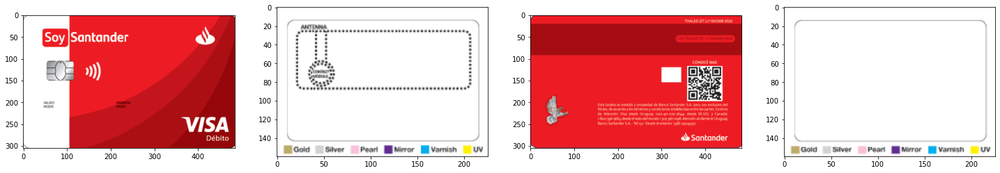

closest cards to U1184338B
Distances: [42.482126773843596, 59.79910066827508, 63.00195353706899, 64.50871600330765]


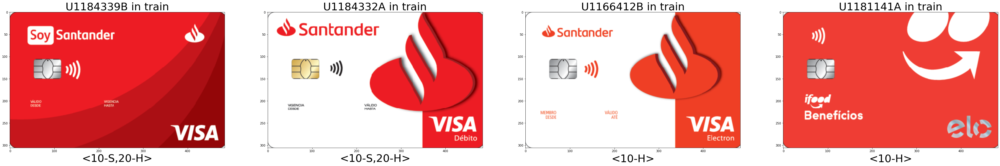

In [ ]:
ref_ucode = 'U1184338B'

print_code_details(ref_ucode, Results, text_data)

ucodes = np.array(list(features_img.keys()))
l_index = np.where(ucodes == ref_ucode)[0][0]

# print ucode and 4 closest cards
ucodes = []
u_dist = []
actuals = []
sorted_indices = np.argsort(distances[l_index])
for i in range(4):
    i_smallest_index = sorted_indices[i+1]
    u_dist.append(distances[l_index][i_smallest_index])
    ucodes.append(list(features_img.keys())[i_smallest_index])
    actuals.append(y[y.index == list(features_img.keys())
                   [i_smallest_index]].newROT.values[0])
print('closest cards to', ref_ucode)
print('Distances:', u_dist)
print_faces_with_script(ucodes, actuals, test)

Again, hard to understand as nne of the closer cards have the predicted script. Best hypothesis is the diference between the clustering algorithms (euclidean distances) and the model methods (neural network).

Lets exclude the data issue (multiple versions of same/similar artwork with diferent script) and re-train the model to see what happens?

## Problem Solving Iterations

### Data Update

#### Equalizing clustered cards routes taking most recent script)

In [20]:
#From DB Clustering we have seen that we can group cards as follows:

X_IMG = list(features_img.values())
distances = pairwise_distances(list(features_img.values()), metric='euclidean')
eps = np.average(distances)-4*np.std(distances)
clustering = DBSCAN(eps, min_samples=2, metric='euclidean').fit(X_IMG)
labels = clustering.labels_
labels = np.array(labels)

In [22]:
# The objective here is to identify in each cluster, the ucodes with diferent scripts and correct OLDER versions with the 'NEWST' script.

df = pd.read_csv(DATA_FOLDER + "UCode_and_Scripts.csv") # Open original CSV with UCode and Script data in order to retrieve the dates
ucodes = np.array(list(features_img.keys())) #Retrieve ucodes in the correct sequence for X and y

# For each ucode identify date in df in the correct squence
dates = []
for ucode in ucodes:
    dates.append(df[df['SIMULATION']==ucode].DATA_INICIO.values[0])

# normalize dates in each cluster if not outlier
for label in range(max(labels)): #from zero to last label
    l_index = np.where(labels == label)[0]
    later_date = dates[l_index[0]]
    imax = l_index[0]
    for i in l_index:
        if dates[i] > later_date:
            later_date = dates[i]
            imax = i
    for i in l_index:
        y.loc[ucodes[i]] = y.loc[ucodes[imax]][0]
        
#Separate y_train and y_test according to existing y_train and test
for ucode in X.index:
    #check if in train or test
    if ucode in train:
        y_train.loc[ucode] = y.loc[ucode][0]
    else:
        y_test.loc[ucode] = y.loc[ucode][0]


In [ ]:
i=0 # Start looking at cluster ZERO

CLUSTER LABEL: 2


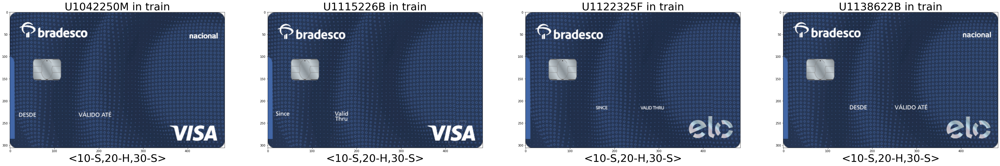

In [ ]:
ucodes = np.array(list(features_img.keys()))
if i <= max(labels):
    l_index = np.where(labels == i)[0] #find label index
    ucode = ucodes[l_index[0]] #find respective ucode
else:
    print('end of clusters')
i = i + 1
print_ucode_cluster(ucode, features_img, labels, distances, y, test)

#### Re-training with new data

In [23]:
#Retrain model with new data

# Model Creation
# encoder model
# image feature layers
inputs1 = Input(shape=(17024,))  # columns dimention of feature matrix X
fe1 = Dropout(0.2)(inputs1)
fe2 = Dense(512, activation='relu')(fe1)

# sequence feature layers
inputs2 = Input(shape=(max_length,))
se1 = Embedding(rot_vocab_size, 512, mask_zero=True)(inputs2)
se2 = Dropout(0.2)(se1)
se3 = LSTM(512)(se2)

# decoder model
decoder1 = add([fe2, se3])
decoder2 = Dense(512, activation='relu')(decoder1)
outputs = Dense(rot_vocab_size, activation='softmax')(decoder2)

LSTM_img_3 = Model(inputs=[inputs1, inputs2], outputs=outputs)
LSTM_img_3.compile(loss='categorical_crossentropy', optimizer='adam')

LSTM_img_3.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 17)]         0           []                               
                                                                                                  
 input_3 (InputLayer)           [(None, 17024)]      0           []                               
                                                                                                  
 embedding_1 (Embedding)        (None, 17, 512)      16896       ['input_4[0][0]']                
                                                                                                  
 dropout_2 (Dropout)            (None, 17024)        0           ['input_3[0][0]']                
                                                                                            

ep: 1
18/18 [==============================] - 7s 89ms/step - loss: 7.8647
ep: 2
18/18 [==============================] - 1s 49ms/step - loss: 1.9765
ep: 3
18/18 [==============================] - 1s 48ms/step - loss: 0.8858
ep: 4
18/18 [==============================] - 1s 46ms/step - loss: 0.6179
ep: 5
18/18 [==============================] - 1s 45ms/step - loss: 0.5250
ep: 6
18/18 [==============================] - 1s 44ms/step - loss: 0.4589
ep: 7
18/18 [==============================] - 1s 45ms/step - loss: 0.4030
ep: 8
18/18 [==============================] - 1s 45ms/step - loss: 0.3510
ep: 9
18/18 [==============================] - 1s 45ms/step - loss: 0.3156
ep: 10
18/18 [==============================] - 1s 45ms/step - loss: 0.3063
ep: 11
18/18 [==============================] - 1s 46ms/step - loss: 0.2911
ep: 12
18/18 [==============================] - 1s 46ms/step - loss: 0.2810
ep: 13
18/18 [==============================] - 1s 44ms/step - loss: 0.2558
ep: 14
18/18 [=======

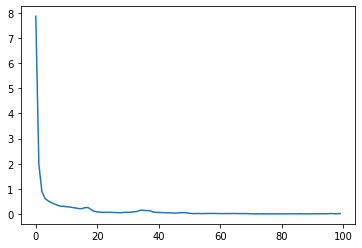

In [24]:
# Re Train model with new y
# new mapping for rots
rot_map = {}
for line, ucode in zip(y.newROT, y.index):
    if ucode not in rot_map:
        rot_map[ucode] = []
    rot_map[ucode].append(TransformRot(line))

epochs = 100
batch_size = 50
steps = len(train) // batch_size
history = []
for i in range(epochs):
    print('ep:', len(history)+1)
    # create data generator
    generator = data_generator(train, rot_map, features_img,
                               rot_tokenizer, max_length, rot_vocab_size, batch_size)
    # fit for one epoch
    hist = LSTM_img_3.fit(generator, epochs=1,
                          steps_per_epoch=steps, verbose=1)
    history.append(hist.history['loss'][0])
    if len(history) > 40:
        if history[-1] == min(history):
            LSTM_img_3.save(
                DATA_FOLDER + 'LSTM_img_3_230124_' + str(i) + '_ls' + "{:.4f}".format(hist.history['loss'][0]) + '.h5')

# plot loss history
plt.plot(history)
plt.show()

In [25]:
print('Minimum loss of', min(history),'at epoch:', np.argmin(history))

Minimum loss of 0.004019443411380053 at epoch: 73


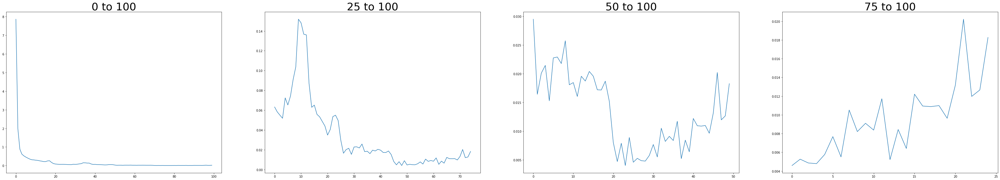

In [26]:
# zoom in plot loss history

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(60, 10))

for i in range(4):
    axes[i].plot(history[i*25:])
    axes[i].set_title(str(i * 25) + " to 100", fontdict={'fontsize': 36})
plt.show()

In [27]:
# Load best epoch so far: LSTM_img_3_230124_99_ls0.0007.h5

###############################################################################################################
#                                           KEY CELL                                                          # 
###############################################################################################################

# Loading the best loss model:
LSTM_img_3 = load_model(DATA_FOLDER + "LSTM_img_3_230124_73_ls0.0040.h5")

#Update Results
Results_eq = pd.DataFrame(data=y_test.values, columns=['Actual']).set_index(X_test.index)

Results_eq = evaluatemodel(LSTM_img_3, features_img,
                        rot_tokenizer, max_length, test, rot_map, Results_eq)
                        

  0%|          | 0/102 [00:00<?, ?it/s]

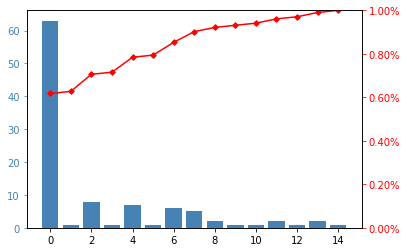

Accuracy 0: 0.6176470588235294
Accuracy 1: 0.7058823529411764


In [29]:
# Dispay pareto of error
LSTM_img_3_plt_data = pd.DataFrame(
    {'count': Results_eq[LSTM_img_3.name + '_Aerr'].value_counts().sort_index().values})
LSTM_img_3_plt_data['cumperc'] = Results_eq[LSTM_img_3.name + '_Aerr'].value_counts(
    normalize=True).sort_index().values.cumsum()

plot_error_pareto(LSTM_img_3_plt_data)

#### Results and Analysis

In [ ]:
Results_eq.head()

,Actual,model_1_prev,model_1_dif,model_1_Aerr
U1176645A,"<10-S,20-S,30-H>","<10-S,20-S,30-H>",0S0H,0.0
U1164870A,<10-H>,<10-H>,0S0H,0.0
U1141085B,"<10-S,20-S,30-H,40-H,50-S>","<10-S,20-S,30-H,40-H,50-S>",0S0H,0.0
U1187667A,"<10-S,20-H>","<10-S,20-H>",0S0H,0.0
U1184456A,"<10-S,20-H>","<10-S,20-H>",0S0H,0.0


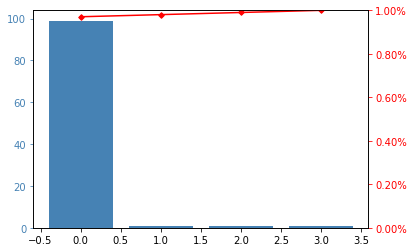

Accuracy 0: 0.9705882352941176
Accuracy 1: 0.9901960784313725


In [ ]:
# Dispay pareto of error
LSTM_img_3_plt_data = pd.DataFrame(
    {'count': Results_eq[LSTM_img_3.name + '_Aerr'].value_counts().sort_index().values})
LSTM_img_3_plt_data['cumperc'] = Results_eq[LSTM_img_3.name + '_Aerr'].value_counts(
    normalize=True).sort_index().values.cumsum()

plot_error_pareto(LSTM_img_3_plt_data)

In [ ]:
misses = Results_eq[Results_eq[LSTM_img_3.name + '_Aerr']>0].sort_values(LSTM_img_3.name + '_Aerr', ascending=False)
display(misses)

,Actual,model_1_prev,model_1_dif,model_1_Aerr
U1185145B,"<10-S,20-S,30-S,40-S,50-H,60-H,70-H>","<10-S,20-S,30-H,40-H>",2S1H,5.5
U1184338B,"<10-S,20-H>","<10-H,20-H>",1S1H,1.5
U1190207A,"<10-S,20-H>",<10-H>,1S0H,1.0


In [ ]:
ucodes = misses.index
for ucode in ucodes:
    #print_code_details(ucode, Results_eq, text_data)
    print(predict_script_single(ucode, LSTM_img_3, rot_tokenizer, features_img, max_length=17, in_text='<'))
    print_ucode_cluster(ucode, features_img, labels, distances, y, test)

,Actual,model_1_prev,model_1_dif,model_1_Aerr
U1185145B,"<10-S,20-S,30-S,40-S,50-H,60-H,70-H>","<10-S,20-S,30-H,40-H>",2S1H,5.5


U1185145B ['Face:\nWhite\n7545 C\n7541 C\n1375/165/2035\n-\nReverse:\nWhite\n7545 C\n7541 C\n', 'F2BABS - Fsquare Black Bright Silver SGL', 'NA - NA']


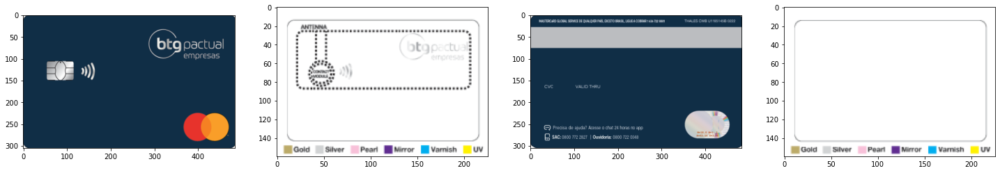

In [ ]:
print_code_details('U1185145B', Results_eq, text_data)

### RNN fine tunning
### More&Better Data
### Better Feature Extractor
### Beter train/test split

In [ ]:
# Split data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25)

# Save indexes in lists (for dictionary handling)
train = X_train.index.values.tolist()
test = X_test.index.values.tolist()

# Salvar dados de treino e teste para posterior reprodução
TestnTrain = [X_train, X_test, y_train, y_test, X, y]
pickle.dump(TestnTrain, open(os.path.join(DATA_FOLDER + 'testntrain' +
            datetime.now().strftime('%y%m%d%H%M%S') + '_25_75.pkl'), 'wb'))

In [ ]:
# Run this code to retrieve previously saved data on test and train split to ensure repeatibility on evaluations
file = open(DATA_FOLDER + 'testntrain230207110730_25_75.pkl', 'rb')
TestnTrain = pickle.load(file)
X_train, X_test, y_train, y_test, X, y = TestnTrain[0], TestnTrain[
    1], TestnTrain[2], TestnTrain[3], TestnTrain[4], TestnTrain[5]

# Save indexes in lists (for dictionary handling)
train = X_train.index.values.tolist()
test = X_test.index.values.tolist()

# Load pickle with text data
file = open(DATA_FOLDER + 'text_features.pkl', 'rb')
text_data = pickle.load(file)

# Create Reuslts df for compairing results af all created models
Results = pd.DataFrame(data=y_test.values, columns=['Actual']).set_index(X_test.index)

# For LSTM create features maaping wich is basically the existin X but in the form of a map with ucode as an index
features = {}
for key, content in zip(X.index, X.values):
    features[key] = content

In [ ]:
# Prepare train and test data for model

# For LSTM create features maaping wich is basically the existin X but in the form of a map with ucode as an index
features = {}
for key, content in zip(X.index, X.values):
    features[key] = content

# create disctionary for scripts (ys). Basically is the y data in the form of a library
rot_map = {}
for line, ucode in zip(y.newROT, y.index):
    if ucode not in rot_map:
        rot_map[ucode] = []
    rot_map[ucode].append(TransformRot(line))

# Create list with all possible operations for tokenization
# INSTEAD OF GETTING WITH FULL VOCAB OF Y, I AM COMBINING ALL POSSIBILITIES TO BE MORE GENERAL.

all_ops = []
max_length = 17  # Maximum of 15 ops plus + StartTad + EndTag
i = 1
while i <= (max_length-2):
    all_ops.append(str(i*10) + "-S")
    all_ops.append(str(i*10) + "-H")
    i += 1
all_ops.append('<')
all_ops.append('>')

# tokenize the text
rot_tokenizer = Tokenizer(filters="", split=" ", lower=False)
rot_tokenizer.fit_on_texts(all_ops)
rot_vocab_size = len(rot_tokenizer.word_index)+1

In [ ]:
# Carregar Flat Features: flat_features é um stet contendo um array con todos os features retirados das 4 imagensdos PDFs (imagem e detalhes de efeitos)
# Ver "Features from Images"
with open(os.path.join('DATA', 'flat_features.pkl'), 'rb') as f:
    flat_features = pickle.load(f)

# criar features maping: cria um set com os features correspondentes aos codigos U do Data Frame 'X'
features_img = {}
for key in X.index:
    features_img[key] = np.concatenate((features[key], flat_features[key]))

In [ ]:
#Retrain model with new data

# Model Creation
# encoder model
# image feature layers
inputs1 = Input(shape=(17024,))  # columns dimention of feature matrix X
fe1 = Dropout(0.2)(inputs1)
fe2 = Dense(512, activation='relu')(fe1)

# sequence feature layers
inputs2 = Input(shape=(max_length,))
se1 = Embedding(rot_vocab_size, 512, mask_zero=True)(inputs2)
se2 = Dropout(0.2)(se1)
se3 = LSTM(512)(se2)

# decoder model
decoder1 = add([fe2, se3])
decoder2 = Dense(512, activation='relu')(decoder1)
outputs = Dense(rot_vocab_size, activation='softmax')(decoder2)

LSTM_img_3 = Model(inputs=[inputs1, inputs2], outputs=outputs)
LSTM_img_3.compile(loss='categorical_crossentropy', optimizer='adam')

LSTM_img_3.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 17)]         0           []                               
                                                                                                  
 input_1 (InputLayer)           [(None, 17024)]      0           []                               
                                                                                                  
 embedding (Embedding)          (None, 17, 512)      16896       ['input_2[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 17024)        0           ['input_1[0][0]']                
                                                                                              

In [ ]:
# Train model evaluating after each step to see loss compared to A_err

epochs = 100
batch_size = 50
steps = len(train) // batch_size
history = []
accuracy = []
Results = pd.DataFrame(data=y_test.values, columns=['Actual']).set_index(X_test.index)
for i in range(epochs):
    print('ep:', len(history)+1)
    # create data generator
    generator = data_generator(train, rot_map, features_img,
                               rot_tokenizer, max_length, rot_vocab_size, batch_size)
    # fit for one epoch
    hist = LSTM_img_3.fit(generator, epochs=1,
                          steps_per_epoch=steps, verbose=1)
    history.append(hist.history['loss'][0])
    if len(history) > 40:
        if history[-1] == min(history):
            LSTM_img_3.save(
                DATA_FOLDER + 'LSTM_img_25_75_' + str(i) + '_ls' + "{:.4f}".format(hist.history['loss'][0]) + '.h5')

    #Update Results
    Results = evaluatemodel(LSTM_img_3, features_img, rot_tokenizer, max_length, test, rot_map, Results)
    accuracy.append(Results[LSTM_img_3.name + '_Aerr'].value_counts(normalize=True).sort_index().values.cumsum()[0])
    print(accuracy[-1])
# plot loss history
plt.plot(history)
plt.show()

ep: 1
15/15 [==============================] - 17s 876ms/step - loss: 10.1131


  0%|          | 0/254 [00:00<?, ?it/s]

0.1141732283464567
ep: 2
15/15 [==============================] - 12s 794ms/step - loss: 2.6689


  0%|          | 0/254 [00:00<?, ?it/s]

0.01968503937007874
ep: 3
15/15 [==============================] - 14s 928ms/step - loss: 1.3764


  0%|          | 0/254 [00:00<?, ?it/s]

0.1889763779527559
ep: 4
15/15 [==============================] - 14s 913ms/step - loss: 0.8852


  0%|          | 0/254 [00:00<?, ?it/s]

0.2795275590551181
ep: 5
15/15 [==============================] - 12s 835ms/step - loss: 0.6937


  0%|          | 0/254 [00:00<?, ?it/s]

0.27165354330708663
ep: 6
15/15 [==============================] - 13s 901ms/step - loss: 0.6104


  0%|          | 0/254 [00:00<?, ?it/s]

0.31496062992125984
ep: 7
15/15 [==============================] - 14s 907ms/step - loss: 0.5639


  0%|          | 0/254 [00:00<?, ?it/s]

0.3700787401574803
ep: 8
15/15 [==============================] - 14s 942ms/step - loss: 0.5485


  0%|          | 0/254 [00:00<?, ?it/s]

0.35039370078740156
ep: 9
15/15 [==============================] - 15s 990ms/step - loss: 0.5219


  0%|          | 0/254 [00:00<?, ?it/s]

0.3543307086614173
ep: 10
15/15 [==============================] - 20s 1s/step - loss: 0.5092


  0%|          | 0/254 [00:00<?, ?it/s]

0.38188976377952755
ep: 11
15/15 [==============================] - 17s 1s/step - loss: 0.4926


  0%|          | 0/254 [00:00<?, ?it/s]

0.41732283464566927
ep: 12
15/15 [==============================] - 17s 1s/step - loss: 0.4475


  0%|          | 0/254 [00:00<?, ?it/s]

0.4015748031496063
ep: 13
15/15 [==============================] - 18s 1s/step - loss: 0.3875


  0%|          | 0/254 [00:00<?, ?it/s]

0.5118110236220472
ep: 14
15/15 [==============================] - 20s 1s/step - loss: 0.3677


  0%|          | 0/254 [00:00<?, ?it/s]

0.5826771653543307
ep: 15
15/15 [==============================] - 26s 2s/step - loss: 0.3391


  0%|          | 0/254 [00:00<?, ?it/s]

0.5118110236220472
ep: 16
15/15 [==============================] - 25s 2s/step - loss: 0.3939


  0%|          | 0/254 [00:00<?, ?it/s]

0.4251968503937008
ep: 17
15/15 [==============================] - 28s 2s/step - loss: 0.3684


  0%|          | 0/254 [00:00<?, ?it/s]

0.4330708661417323
ep: 18
15/15 [==============================] - 32s 2s/step - loss: 0.3171


  0%|          | 0/254 [00:00<?, ?it/s]

0.5433070866141733
ep: 19
15/15 [==============================] - 31s 2s/step - loss: 0.2841


  0%|          | 0/254 [00:00<?, ?it/s]

0.6220472440944882
ep: 20
15/15 [==============================] - 37s 2s/step - loss: 0.2129


  0%|          | 0/254 [00:00<?, ?it/s]

0.6456692913385826
ep: 21
15/15 [==============================] - 37s 2s/step - loss: 0.1878


  0%|          | 0/254 [00:00<?, ?it/s]

0.6811023622047244
ep: 22
15/15 [==============================] - 38s 3s/step - loss: 0.1732


  0%|          | 0/254 [00:00<?, ?it/s]

0.6614173228346457
ep: 23
15/15 [==============================] - 41s 3s/step - loss: 0.1848


  0%|          | 0/254 [00:00<?, ?it/s]

0.6259842519685039
ep: 24
15/15 [==============================] - 42s 3s/step - loss: 0.1900


  0%|          | 0/254 [00:00<?, ?it/s]

0.6299212598425197
ep: 25
15/15 [==============================] - 41s 3s/step - loss: 0.1825


  0%|          | 0/254 [00:00<?, ?it/s]

0.6732283464566929
ep: 26
15/15 [==============================] - 42s 3s/step - loss: 0.1638


  0%|          | 0/254 [00:00<?, ?it/s]

0.6614173228346457
ep: 27
15/15 [==============================] - 43s 3s/step - loss: 0.1644


  0%|          | 0/254 [00:00<?, ?it/s]

0.65748031496063
ep: 28
15/15 [==============================] - 49s 3s/step - loss: 0.1567


  0%|          | 0/254 [00:00<?, ?it/s]

0.6141732283464567
ep: 29
15/15 [==============================] - 50s 3s/step - loss: 0.1402


  0%|          | 0/254 [00:00<?, ?it/s]

0.5708661417322834
ep: 30
15/15 [==============================] - 51s 3s/step - loss: 0.1840


  0%|          | 0/254 [00:00<?, ?it/s]

0.6181102362204725
ep: 31
15/15 [==============================] - 50s 3s/step - loss: 0.1764


  0%|          | 0/254 [00:00<?, ?it/s]

0.6181102362204725
ep: 32
15/15 [==============================] - 57s 4s/step - loss: 0.1873


  0%|          | 0/254 [00:00<?, ?it/s]

0.5905511811023622
ep: 33
15/15 [==============================] - 56s 4s/step - loss: 0.2151


  0%|          | 0/254 [00:00<?, ?it/s]

0.47244094488188976
ep: 34
15/15 [==============================] - 60s 4s/step - loss: 0.2323


  0%|          | 0/254 [00:00<?, ?it/s]

0.6535433070866141
ep: 35
15/15 [==============================] - 65s 4s/step - loss: 0.2298


  0%|          | 0/254 [00:00<?, ?it/s]

0.6181102362204725
ep: 36
15/15 [==============================] - 79s 5s/step - loss: 0.2596


  0%|          | 0/254 [00:00<?, ?it/s]

0.5551181102362205
ep: 37
15/15 [==============================] - 66s 4s/step - loss: 0.2198


  0%|          | 0/254 [00:00<?, ?it/s]

0.6023622047244095
ep: 38
15/15 [==============================] - 70s 5s/step - loss: 0.1594


  0%|          | 0/254 [00:00<?, ?it/s]

0.7204724409448819
ep: 39
15/15 [==============================] - 77s 5s/step - loss: 0.1477


  0%|          | 0/254 [00:00<?, ?it/s]

0.6062992125984252
ep: 40
15/15 [==============================] - 72s 5s/step - loss: 0.1435


  0%|          | 0/254 [00:00<?, ?it/s]

0.7401574803149606
ep: 41
15/15 [==============================] - 97s 7s/step - loss: 0.1297


  0%|          | 0/254 [00:00<?, ?it/s]

0.7125984251968503
ep: 42
15/15 [==============================] - 100s 7s/step - loss: 0.1299


  0%|          | 0/254 [00:00<?, ?it/s]

0.5984251968503937
ep: 43
15/15 [==============================] - 103s 7s/step - loss: 0.1211


  0%|          | 0/254 [00:00<?, ?it/s]

0.6417322834645669
ep: 44
15/15 [==============================] - 101s 7s/step - loss: 0.0935


  0%|          | 0/254 [00:00<?, ?it/s]

0.6771653543307087
ep: 45
15/15 [==============================] - 79s 5s/step - loss: 0.0881


  0%|          | 0/254 [00:00<?, ?it/s]

0.7086614173228346
ep: 46
15/15 [==============================] - 82s 6s/step - loss: 0.0753


  0%|          | 0/254 [00:00<?, ?it/s]

0.7362204724409449
ep: 47
15/15 [==============================] - 85s 6s/step - loss: 0.0809


  0%|          | 0/254 [00:00<?, ?it/s]

0.7480314960629921
ep: 48
15/15 [==============================] - 86s 6s/step - loss: 0.1084


  0%|          | 0/254 [00:00<?, ?it/s]

0.7559055118110236
ep: 49
15/15 [==============================] - 90s 6s/step - loss: 0.1596


  0%|          | 0/254 [00:00<?, ?it/s]

0.7125984251968503
ep: 50
15/15 [==============================] - 88s 6s/step - loss: 0.1898


  0%|          | 0/254 [00:00<?, ?it/s]

0.6732283464566929
ep: 51
15/15 [==============================] - 94s 6s/step - loss: 0.1289


  0%|          | 0/254 [00:00<?, ?it/s]

0.7677165354330708
ep: 52
15/15 [==============================] - 95s 6s/step - loss: 0.0829


  0%|          | 0/254 [00:00<?, ?it/s]

0.8031496062992126
ep: 53
15/15 [==============================] - 98s 7s/step - loss: 0.0605


  0%|          | 0/254 [00:00<?, ?it/s]

0.7283464566929134
ep: 54
15/15 [==============================] - 98s 7s/step - loss: 0.1129


  0%|          | 0/254 [00:00<?, ?it/s]

0.7598425196850394
ep: 55
15/15 [==============================] - 104s 7s/step - loss: 0.0512


  0%|          | 0/254 [00:00<?, ?it/s]

0.7874015748031497
ep: 56
15/15 [==============================] - 98s 7s/step - loss: 0.0668


  0%|          | 0/254 [00:00<?, ?it/s]

0.7834645669291339
ep: 57
15/15 [==============================] - 105s 7s/step - loss: 0.0459


  0%|          | 0/254 [00:00<?, ?it/s]

# Pre Implementation

Once we have a ML model that can learn how to transform information from card simulation into a printing scriop, now we have to create a stand-alone application that will use this model to acturally transform a Card Simulation in PDF format into a script. So the aplication will need to:

1. Get a U-Code from input
2. Open PDF to analyse
3. Extract the text and image information from the PDF file
4. organise data into an X and y array
5. Run the model to get the Script

Alternatively, we could have the interface to suggest one or more scripts when there are more than one script with high probability of being the right one.

Bellow se see the resulting interface:

![image.png](attachment:image.png)

In [ ]:
# Import modules as this part should run stantalone...

import tkinter as tk
from tkinter import filedialog
from PIL import Image, ImageTk
import os
import glob
import fitz
import numpy as np
import pickle
from keras.preprocessing.text import Tokenizer
from tensorflow import keras
from keras.models import Model
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.preprocessing.image import load_img, img_to_array
from keras.models import load_model
from keras.preprocessing.sequence import pad_sequences

DATA_FOLDER = 'DATA/'

# In order to evaluate the model we need some scripts to convert the array resut back to operations


def idx_to_op_imp(integer, tokenizer):
    for operacao, index in tokenizer.word_index.items():
        if index == integer:
            return operacao
    return None

# Re-genera script for UCODE


def predict_script_imp(model, ufeatures, tokenizer, max_length):
    # add start tag for generation process
    in_text = '<'
    cert_arry = []
    # iterate over the max length of sequence
    for i in range(max_length):
        # encode input sequence
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        # pad the sequence
        sequence = pad_sequences([sequence], max_length)
        # predict next word
        yhat = model.predict([ufeatures, sequence], verbose=0)
        # get highest certainty
        cert_arry.append(np.amax(yhat))
        # get index with high probability
        yhat = np.argmax(yhat)
        # convert index to word
        operation = idx_to_op_imp(yhat, tokenizer)
        # stop if word not found
        if operation is None:
            break
        # append word as input for generating next word
        in_text += " " + operation
        # stop if we reach end tag
        if operation == '>':
            break
    return in_text, cert_arry


def choose_pdf():
    global features_img
    # Clean WRKDIR
    files = glob.glob('WRKDIR/*')
    for f in files:
        os.remove(f)
    reset_form()
    # Open PDF and get main info (text and images)
    file = filedialog.askopenfilename(
        initialdir="New folder/", title="Select file", filetypes=(("pdf files", "*.pdf"), ("all files", "*.*")))
    ucode = file[file.find("_U")+1:file.find("_U")+9] + \
        file[file.find("_Rev")+4:file.find("_Rev")+5]
    pdf_file = fitz.open(file)  # open the file
    page = pdf_file[0]

    # Get text
    text = page.get_text(option='blocks')
    text_full = page.get_text()
    plastic_type = text_full[text_full.find("PLASTIC TYPE:")+len(
        "PLASTIC TYPE:")+1:text_full.find("\n", text_full.find("PLASTIC TYPE:")+1)]
    effect = text_full[text_full.find(
        "EFFECT:")+len("EFFECT:")+1:text_full.find("\n", text_full.find("EFFECT:")+1)]
    # colorblock
    ii = -5
    for i in [1, 2, 3, 4, 5]:
        if (25 < text[-i][0] < 34) and (423 < text[-i][1] < 434):
            ii = -i
    text_data = text[ii][4] + ' ' + plastic_type + ' ' + \
        effect  # colors text block, plastic type, effect

    # Get images
    clip_name = ('FACE', 'BACK', 'Front_Effects', 'Back_Effects')
    # Position of start and end points of clips
    RI = ((159, 306), (159, 540), (27, 320), (27, 616))
    RF = ((401, 459), (401, 693), (140, 400), (140, 696))
    matriz = (2, 2, 2, 2)
    pix = []
    for n, m, ri, rf in zip(clip_name, matriz, RI, RF):
        pix = page.get_pixmap(matrix=fitz.Matrix(m, m), clip=fitz.Rect(ri, rf))
        pix.save("WRKDIR/" + str(ucode) + "_" + str(n) + ".png")

    # Update GUI
    p_lbl_01.config(text=ucode)
    p_lbl_11.config(text=plastic_type)
    p_lbl_22.config(text=effect)
    p_lbl_33.config(text=text[ii][4].replace("\n", " "))

    # pre-load model
    if p_lbl_01['text'][0] == 'U':
        # transform text
        # create X
        text_data = p_lbl_33['text'] + " " + \
            p_lbl_11['text'] + " " + p_lbl_22['text']
        features = tokenizer.texts_to_matrix([text_data])[0][1:]

        # transform images
        img_features = []
        for img_name in os.listdir('WRKDIR'):
            # load the image from file
            img_path = 'WRKDIR/' + img_name
            image = load_img(img_path, target_size=(224, 224))
            # convert image pixels to numpy array
            image = img_to_array(image)
            # reshape data for model
            image = image.reshape(
                (1, image.shape[0], image.shape[1], image.shape[2]))
            # preprocess image for vgg
            image = preprocess_input(image)
            # extract features
            feature = mVGG16.predict(image, verbose=0)
            # store feature
            img_features.append(feature)
        flat_features = np.concatenate(
            (img_features[0][0], img_features[1][0], img_features[2][0], img_features[3][0]))

        # Concatenate features
        features_img = np.concatenate((features, flat_features))

    image1 = Image.open('WRKDIR/' + str(ucode) + '_FACE.png')
    image1 = image1.resize((150, 100), Image.ANTIALIAS)
    im1 = ImageTk.PhotoImage(image1)
    p_lbl_51.config(image=im1)
    p_lbl_51.image = im1
    image1 = Image.open('WRKDIR/' + str(ucode) + '_Front_Effects.png')
    image1 = image1.resize((150, 100), Image.ANTIALIAS)
    im2 = ImageTk.PhotoImage(image1)
    p_lbl_52.config(image=im2)
    p_lbl_52.image = im2
    image1 = Image.open('WRKDIR/' + str(ucode) + '_BACK.png')
    image1 = image1.resize((150, 100), Image.ANTIALIAS)
    im3 = ImageTk.PhotoImage(image1)
    p_lbl_53.config(image=im3)
    p_lbl_53.image = im3
    image1 = Image.open('WRKDIR/' + str(ucode) + '_Back_Effects.png')
    image1 = image1.resize((150, 100), Image.ANTIALIAS)
    im4 = ImageTk.PhotoImage(image1)
    p_lbl_54.config(image=im4)
    p_lbl_54.image = im4
    free_prediction_ntr.config(state='normal')


def simple_predict():
    if p_lbl_01['text'][0] == 'U':
        # Predict
        script, cert_arry = predict_script_imp(
            LSTM_img_2, np.array([features_img]), rot_tokenizer, 17)

        # adjust values
        partials = ""
        total_certainty = 1
        for c in cert_arry:
            partials = partials + " " + '{:.3g}%'.format(c*100)
            total_certainty = total_certainty * c
        certainty = '{:.2f}%'.format(total_certainty*100)
        script = script.replace("< ", "<")
        script = script.replace(" >", ">")
        script = script.replace(' ', ',')

        pred_lab_2.config(text=script)
        pred_lab_25.config(text=partials)
        pred_lab_4.config(text=certainty)


def model_load():
    filename = filedialog.askopenfilename(initialdir="DATA", title="Select model", filetypes=(
        ("H5 model", "*.h5"), ("all files", "*.*")))
    # Load best Model
    LSTM_img_2 = load_model(filename)
    m_lbl_11.config(text=os.path.basename(filename))


def tokenizer_load():
    filename = filedialog.askopenfilename(initialdir="DATA", title="Select model", filetypes=(
        ("pickles", "*.pickle"), ("all files", "*.*")))
    # Load tokenizer
    with open(filename, 'rb') as handle:
        tokenizer = pickle.load(handle)
    m_lbl_33.config(text=os.path.basename(filename))


def rot_tokenizer_load():
    filename = filedialog.askopenfilename(initialdir="DATA", title="Select model", filetypes=(
        ("pickles", "*.pickle"), ("all files", "*.*")))
    # Load tokenizer
    with open(filename, 'rb') as handle:
        rot_tokenizer = pickle.load(handle)
    m_lbl_44.config(text=os.path.basename(filename))


def checkfree(a, b, c):
    v = free_prediction_ntr.get()
    if set(v.split()).issubset(rot_tokenizer.word_index):
        if v != "":
            if v[0] == '<':
                fp, fc = free_predictor(LSTM_img_2, np.array(
                    [features_img]), rot_tokenizer, 17)
                free_p_result_lbl.config(text=fp)
                fc_txt = ''
                for c in fc:
                    fc_txt = fc_txt + "  " + '{:.3g}%'.format(c*100)
                free_p_certainty_lbl.config(text=fc_txt[2:])
            else:
                free_p_result_lbl.config(text=v)
        else:
            free_p_result_lbl.config(text=v)


def free_predictor(model, ufeatures, tokenizer, max_length):
    if p_lbl_01['text'][0] == 'U':
        # add start tag for generation process
        in_text = free_rot.get()
        text = in_text
        cert_arry = []
        # iterate over the max length of sequence
        for i in range(max_length):
            # encode input sequence
            sequence = tokenizer.texts_to_sequences([in_text])[0]
            # pad the sequence
            sequence = pad_sequences([sequence], max_length)
            # predict next word
            yhat = model.predict([ufeatures, sequence], verbose=0)
            # get highest certainty
            cert_arry.append(np.amax(yhat))
            # get index with high probability
            yhat = np.argmax(yhat)
            # convert index to word
            operation = idx_to_op_imp(yhat, tokenizer)
            # stop if word not found
            if operation is None:
                break
            # append word as input for generating next word
            in_text += " " + operation
            # stop if we reach end tag
            if operation == '>':
                break

        # calculate free text certainty

        old_cert = []
        if len(text.split()) > 1:
            for op in text.split():
                old_text, new_text = split_intext(text)
                sequence = rot_tokenizer.texts_to_sequences([old_text])[0]
                sequence = pad_sequences([sequence], max_length)
                yhat = LSTM_img_2.predict(
                    [np.array([features_img]), sequence], verbose=0)
                sequence = rot_tokenizer.texts_to_sequences([new_text])[0]
                old_cert.append(yhat[0][sequence[0]])
                if old_text != '<':
                    text = old_text
                else:
                    break
            old_cert.reverse()

    return in_text, np.concatenate((old_cert, cert_arry))


def split_intext(text):
    new_text = text.split()[-1]
    old_text = ""
    i = 0
    while i < len(text.split())-1:
        old_text = old_text + " " + text.split()[i]
        i = i+1
    return old_text[1:], new_text


def reset_form():
    # PREDICTION
    pred_lab_2.config(text="")
    pred_lab_25.config(text="")
    pred_lab_4.config(text="")
    # FREE PREDICT
    free_rot = tk.StringVar(value="")
    free_rot.trace("w", checkfree)
    free_prediction_ntr.delete(0, 'end')
    free_p_result_lbl.config(text='')
    free_p_certainty_lbl.config(text='')

# INITIALIZE GUI

image1 = Image.open('Documentation Images/card.png')
image2 = Image.open('Documentation Images/guten.png')

prediction_model_file = 'best_model_230106_acc91.h5'
pdf_tokenizer = 'tokenizer.pickle'
script_tokenizer = 'rot_tokenizer.pickle'

root = tk.Tk()
root.title('Gutenberg Script Wizard')
root.geometry("700x710")
root.configure(bg='#242A75')

script = '<XXXX>'
certainty = 'XX,XX%'
partials = 'XX,XX / XX,XX'

# model info and setup
model_frm = tk.Frame(master=root, relief=tk.SUNKEN, borderwidth=2, height=150)
model_frm.pack(expand=False, fill=tk.BOTH, padx=5, pady=5)

m_lbl_0 = tk.Label(master=model_frm, text='Model Configuration:')
m_lbl_0.place(x=0, y=0)

m_lbl_1 = tk.Label(master=model_frm, text=' -Prediction Model:')
m_lbl_1.place(x=0, y=20)
m_lbl_11 = tk.Label(
    master=model_frm, text=prediction_model_file, relief=tk.SUNKEN, width=30)
m_lbl_11.place(x=200, y=20)
m_but_1 = tk.Button(text='..', width=3, height=1, command=model_load)
m_but_1.place(x=425, y=23)

m_lbl_2 = tk.Label(master=model_frm, text=' -Image Feature Extraction:')
m_lbl_2.place(x=0, y=50)
m_lbl_22 = tk.Label(
    master=model_frm, text='VGG16 - tensorflow', relief=tk.SUNKEN, width=30)
m_lbl_22.place(x=200, y=50)

m_lbl_3 = tk.Label(master=model_frm, text=' -PDF Tokenizer:')
m_lbl_3.place(x=0, y=80)
m_lbl_33 = tk.Label(master=model_frm, text=pdf_tokenizer,
                    relief=tk.SUNKEN, width=30)
m_lbl_33.place(x=200, y=80)
m_but_3 = tk.Button(text='..', width=3, height=1, command=tokenizer_load)
m_but_3.place(x=425, y=83)

m_lbl_4 = tk.Label(master=model_frm, text=' -Script Tokenizer:')
m_lbl_4.place(x=0, y=110)
m_lbl_44 = tk.Label(master=model_frm, text=script_tokenizer,
                    relief=tk.SUNKEN, width=30)
m_lbl_44.place(x=200, y=110)
m_but_4 = tk.Button(text='..', width=3, height=1, command=rot_tokenizer_load)
m_but_4.place(x=425, y=113)

image2 = image2.resize((170, 100), Image.ANTIALIAS)
img = ImageTk.PhotoImage(image2)
guten_lbl = tk.Label(master=model_frm, width='170', image=img)
guten_lbl.image = img
guten_lbl.place(x=480, y=20)

# PDF info frame

pdf_frm = tk.Frame(master=root, relief=tk.GROOVE, borderwidth=2, height=250)
pdf_frm.pack(expand=True, fill=tk.BOTH, padx=5, pady=3)

p_but = tk.Button(master=pdf_frm, text='Please select Card Simulation PDF file',
                  width=100, height=2, command=choose_pdf)
p_but.pack(padx=3, pady=3)

p_lbl_0 = tk.Label(master=pdf_frm, text="PDF Validation info:")
p_lbl_0.place(x=0, y=45)
p_lbl_01 = tk.Label(master=pdf_frm, text='')
p_lbl_01.place(x=200, y=45)

p_lbl_1 = tk.Label(master=pdf_frm, text='PLASTIC TYPE:')
p_lbl_1.place(x=0, y=65)
plastic_type = "non"
p_lbl_11 = tk.Label(master=pdf_frm, text=plastic_type,
                    relief=tk.SUNKEN, width=30)
p_lbl_11.place(x=200, y=65)

p_lbl_2 = tk.Label(master=pdf_frm, text='EFFECT:')
p_lbl_2.place(x=0, y=85)
effect = "non"
p_lbl_22 = tk.Label(master=pdf_frm, text=effect, relief=tk.SUNKEN, width=30)
p_lbl_22.place(x=200, y=85)

p_lbl_3 = tk.Label(master=pdf_frm, text='COLORS:')
p_lbl_3.place(x=0, y=105)
colors = "non"
p_lbl_33 = tk.Label(master=pdf_frm, text=colors,
                    relief=tk.SUNKEN, width=60, height=2)
p_lbl_33.place(x=200, y=105)


image1 = image1.resize((150, 100), Image.ANTIALIAS)
im1 = ImageTk.PhotoImage(image1)
im2 = ImageTk.PhotoImage(image1)
im3 = ImageTk.PhotoImage(image1)
im4 = ImageTk.PhotoImage(image1)

p_lbl_51 = tk.Label(master=pdf_frm, width='155', image=im1)
p_lbl_51.image = im1
p_lbl_51.place(x=5, y=145)
p_lbl_52 = tk.Label(master=pdf_frm, width='155', image=im2)
p_lbl_52.image = im2
p_lbl_52.place(x=165, y=145)
p_lbl_53 = tk.Label(master=pdf_frm, width='155', image=im3)
p_lbl_53.image = im3
p_lbl_53.place(x=320, y=145)
p_lbl_54 = tk.Label(master=pdf_frm, width='155', image=im4)
p_lbl_54.image = im4
p_lbl_54.place(x=475, y=145)

p_but_6 = tk.Button(master=pdf_frm, text='CONFIRM',
                    width=96, height=2, command=simple_predict)
p_but_6.place(x=2, y=250)

# PREDICTION

pred_frame = tk.Frame(master=root, relief=tk.RAISED, borderwidth=2)
pred_frame.pack(expand=True, fill=tk.BOTH, padx=5, pady=3)

pred_lab_1 = tk.Label(master=pred_frame, text="SCRIPT:")
pred_lab_1.place(x=0, y=0)
pred_lab_2 = tk.Label(master=pred_frame, text=script, font=('Courier New', 14))
pred_lab_2.place(x=0, y=15)
pred_lab_25 = tk.Label(master=pred_frame, text=partials,
                       font=('Courier New', 11))
pred_lab_25.place(x=0, y=35)
pred_lab_3 = tk.Label(master=pred_frame, text="Certainty:")
pred_lab_3.place(x=0, y=55)
pred_lab_4 = tk.Label(master=pred_frame, text=certainty)
pred_lab_4.place(x=82, y=55)

# FREE PREDICT
free_rot = tk.StringVar(value="")
free_rot.trace("w", checkfree)
free_prediction_ntr = tk.Entry(master=pred_frame, width=62, font=(
    'Courier New', 14), textvariable=free_rot, state='disabled')
free_prediction_ntr.place(x=0, y=100)
free_p_result_lbl = tk.Label(master=pred_frame, text='<XX>')
free_p_result_lbl.place(x=0, y=130)
free_p_certainty_lbl = tk.Label(master=pred_frame, text='XX%')
free_p_certainty_lbl.place(x=0, y=150)

# Load model info
# text tokenizer
with open(DATA_FOLDER + 'tokenizer.pickle', 'rb') as handle:
    tokenizer = pickle.load(handle)
# VGG16
mVGG16 = VGG16()
mVGG16 = Model(inputs=mVGG16.inputs, outputs=mVGG16.layers[-2].output)
# Load best Model
LSTM_img_2 = load_model(DATA_FOLDER + 'best_model_230106_acc91.h5')
# loading rot_tokenizer (decoding)
with open(DATA_FOLDER + 'rot_tokenizer.pickle', 'rb') as handle:
    rot_tokenizer = pickle.load(handle)
max_length = 17

root.mainloop()


## Important considerations regarding process changes during the study and future needs for model adaptation

# References

REF1 - About Thales DIS - 
https://www.thalesgroup.com/en/markets/digital-identity-and-security

REF2 - How to build a machine learning model in 7 steps - 
https://www.techtarget.com/searchenterpriseai/feature/How-to-build-a-machine-learning-model-in-7-steps

REF3 - Working with PDF</BR>
https://geekyhumans.com/how-to-extract-text-and-images-from-pdf-using-python/
https://www.thepythoncode.com/topic/handling-pdf-files?p=2
https://pymupdf.readthedocs.io/en/latest/module.html



https://www.nltk.org/ - Natural Language ToolKit for preprocessing and processing text
https://scikit-learn.org/stable/ - Several models for achine learning
https://www.tensorflow.org/api_docs/python/tf/keras/Model - Modeling Long Short-term Memory NNs
https://www.hackersrealm.net/post/image-caption-generator-using-python - Excelent examplo of a one-to-many NN
https://towardsdatascience.com/nlp-sequence-to-sequence-networks-part-2-seq2seq-model-encoderdecoder-model-6c22e29fd7e1 - Encoder/Decoder model explanation
https://www.hackersrealm.net/post/image-caption-generator-using-python (base model for LSTM)

REF4 - Choosing the right estimator - 
https://scikit-learn.org/stable/tutorial/machine_learning_map/index.html
https://explore.mathworks.com/common-machine-learning-challenges

REF5 - Automation for web scraping (Downloading PDFs)
https://www.selenium.dev/documentation/webdriver/
https://pyautogui.readthedocs.io/en/latest/

